Problem Statement and Dataset: https://drive.google.com/drive/folders/19utD66Zfb7WgtqWkKBrlBmBIse-ph8HI?usp=sharing <br>
Google Doc:
https://docs.google.com/document/d/1aUTecNW_sx84H295Q-e6aNb6SVCGR7aiarbUg9PmN20/edit#<br>
### Tasks:


*   Data Preprocessing
*   Data Visualisation (EDA)
*   Feature Engineering
*   Models



In [ ]:
# Importing Important Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
# Importing Dataset
from google.colab import drive
drive.mount('/content/drive')

path = "/content/drive/MyDrive/Train_data.csv"
df = pd.read_csv(path)
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,Aug-20,Sep-20,Oct-20,Nov-20,Dec-20,Jan-21,Feb-21,Mar-21,Apr-21,May-21
0,Wh-1,NORTH,SKU-1,27,13,30,14,22,8,8,...,12,8,8,8,8,8,14,16,8,12
1,Wh-1,NORTH,SKU-2,88,28,127,130,58,10,7,...,16,7,7,7,7,7,13,43,13,43
2,Wh-1,NORTH,SKU-3,6,6,6,6,6,6,6,...,8,6,6,6,6,6,6,8,26,6
3,Wh-1,NORTH,SKU-4,162,184,110,172,90,40,18,...,82,78,38,18,22,28,36,352,58,18
4,Wh-1,NORTH,SKU-5,171,402,627,615,300,417,141,...,468,216,75,6,30,66,141,699,183,24


In [ ]:
cols1819 = ['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']
cols1920 = ['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
            'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']
cols2021 = ['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']

df['year1819'] = df[cols1819].sum(axis=1)
df['year1920'] = df[cols1920].sum(axis=1)
df['year2021'] = df[cols2021].sum(axis=1) 
df.head()

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,Nov-20,Dec-20,Jan-21,Feb-21,Mar-21,Apr-21,May-21,year1819,year1920,year2021
0,Wh-1,NORTH,SKU-1,27,13,30,14,22,8,8,...,8,8,8,14,16,8,12,167,182,135
1,Wh-1,NORTH,SKU-2,88,28,127,130,58,10,7,...,7,7,7,13,43,13,43,537,609,359
2,Wh-1,NORTH,SKU-3,6,6,6,6,6,6,6,...,6,6,6,6,8,26,6,72,94,114
3,Wh-1,NORTH,SKU-4,162,184,110,172,90,40,18,...,18,22,28,36,352,58,18,1004,1026,1258
4,Wh-1,NORTH,SKU-5,171,402,627,615,300,417,141,...,6,30,66,141,699,183,24,3048,3096,4263


In [ ]:
df["sum"] = df.sum(axis=1)
df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,Dec-20,Jan-21,Feb-21,Mar-21,Apr-21,May-21,year1819,year1920,year2021,sum
0,Wh-1,NORTH,SKU-1,27,13,30,14,22,8,8,...,8,8,14,16,8,12,167,182,135,968
1,Wh-1,NORTH,SKU-2,88,28,127,130,58,10,7,...,7,7,13,43,13,43,537,609,359,3010
2,Wh-1,NORTH,SKU-3,6,6,6,6,6,6,6,...,6,6,6,8,26,6,72,94,114,560
3,Wh-1,NORTH,SKU-4,162,184,110,172,90,40,18,...,22,28,36,352,58,18,1004,1026,1258,6576
4,Wh-1,NORTH,SKU-5,171,402,627,615,300,417,141,...,30,66,141,699,183,24,3048,3096,4263,20814


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1039 entries, 0 to 1038
Data columns (total 45 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Warehouse id  1039 non-null   object
 1   Region        1039 non-null   object
 2   SKU id        1039 non-null   object
 3   Apr-18        1039 non-null   int64 
 4   May-18        1039 non-null   int64 
 5   Jun-18        1039 non-null   int64 
 6   Jul-18        1039 non-null   int64 
 7   Aug-18        1039 non-null   int64 
 8   Sep-18        1039 non-null   int64 
 9   Oct-18        1039 non-null   int64 
 10  Nov-18        1039 non-null   int64 
 11  Dec-18        1039 non-null   int64 
 12  Jan-19        1039 non-null   int64 
 13  Feb-19        1039 non-null   int64 
 14  Mar-19        1039 non-null   int64 
 15  Apr-19        1039 non-null   int64 
 16  May-19        1039 non-null   int64 
 17  Jun-19        1039 non-null   int64 
 18  Jul-19        1039 non-null   int64 
 19  Aug-19

In [ ]:
df.describe()

,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,Nov-18,Dec-18,Jan-19,...,Dec-20,Jan-21,Feb-21,Mar-21,Apr-21,May-21,year1819,year1920,year2021,sum
count,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,...,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000,1039.000000
mean,248.102984,216.824832,209.153994,157.714148,174.883542,158.524543,161.719923,201.784408,212.032724,177.205967,...,388.457170,274.597690,275.120308,387.707411,150.856593,122.123195,2447.695861,2704.565929,3084.451396,16473.426372
std,785.750982,493.283000,480.078224,351.488015,450.706178,374.631088,376.697992,614.940984,766.657455,790.932939,...,1374.171617,805.756394,699.096181,1106.507945,420.741507,329.277995,6836.624909,7931.217446,7662.793234,42764.524239
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,12.000000,14.000000,76.000000
25%,9.000000,9.500000,10.000000,10.000000,9.000000,10.000000,9.000000,10.000000,10.000000,10.000000,...,30.500000,22.500000,32.000000,43.000000,18.000000,14.000000,144.000000,204.000000,487.000000,2144.000000
50%,18.000000,19.000000,19.000000,18.000000,19.000000,19.000000,19.000000,19.000000,19.000000,20.000000,...,106.000000,77.000000,105.000000,129.000000,46.000000,33.000000,442.000000,660.000000,1103.000000,5268.000000
75%,191.000000,186.500000,192.500000,137.000000,128.000000,140.000000,127.500000,143.500000,170.000000,130.500000,...,297.500000,218.500000,254.000000,339.500000,133.000000,92.000000,2137.000000,2339.000000,2701.000000,14920.000000
max,17540.000000,5029.000000,5823.000000,3151.000000,6700.000000,4604.000000,3576.000000,10322.000000,18336.000000,19324.000000,...,30996.000000,12020.000000,11641.000000,16483.000000,9199.000000,4669.000000,142432.000000,149500.000000,122372.000000,786312.000000


In [ ]:
df.isnull().sum()

Warehouse id    0
Region          0
SKU id          0
Apr-18          0
May-18          0
Jun-18          0
Jul-18          0
Aug-18          0
Sep-18          0
Oct-18          0
Nov-18          0
Dec-18          0
Jan-19          0
Feb-19          0
Mar-19          0
Apr-19          0
May-19          0
Jun-19          0
Jul-19          0
Aug-19          0
Sep-19          0
Oct-19          0
Nov-19          0
Dec-19          0
Jan-20          0
Feb-20          0
Mar-20          0
Apr-20          0
May-20          0
Jun-20          0
Jul-20          0
Aug-20          0
Sep-20          0
Oct-20          0
Nov-20          0
Dec-20          0
Jan-21          0
Feb-21          0
Mar-21          0
Apr-21          0
May-21          0
year1819        0
year1920        0
year2021        0
sum             0
dtype: int64

In [ ]:
df.columns

Index(['Warehouse id', 'Region', 'SKU id', 'Apr-18', 'May-18', 'Jun-18',
       'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 'Dec-18', 'Jan-19',
       'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19',
       'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20',
       'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20',
       'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21',
       'year1819', 'year1920', 'year2021', 'sum'],
      dtype='object')

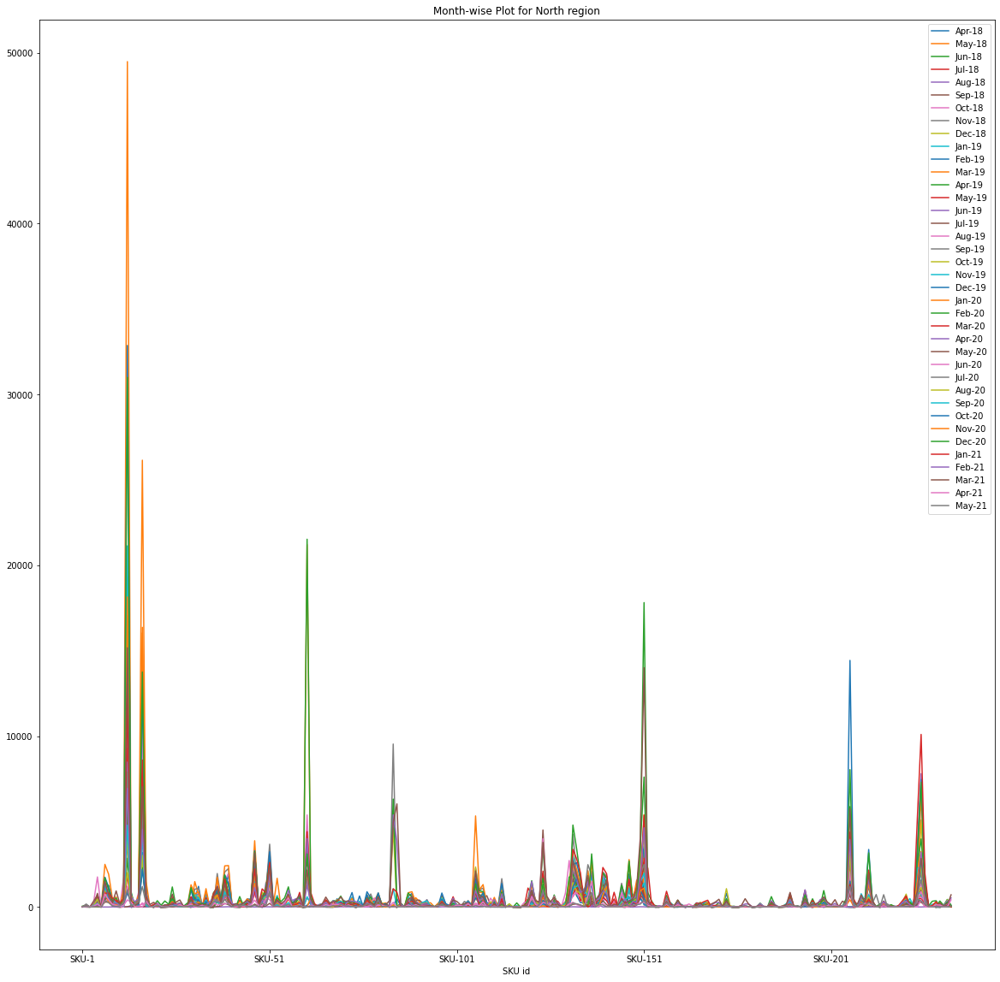

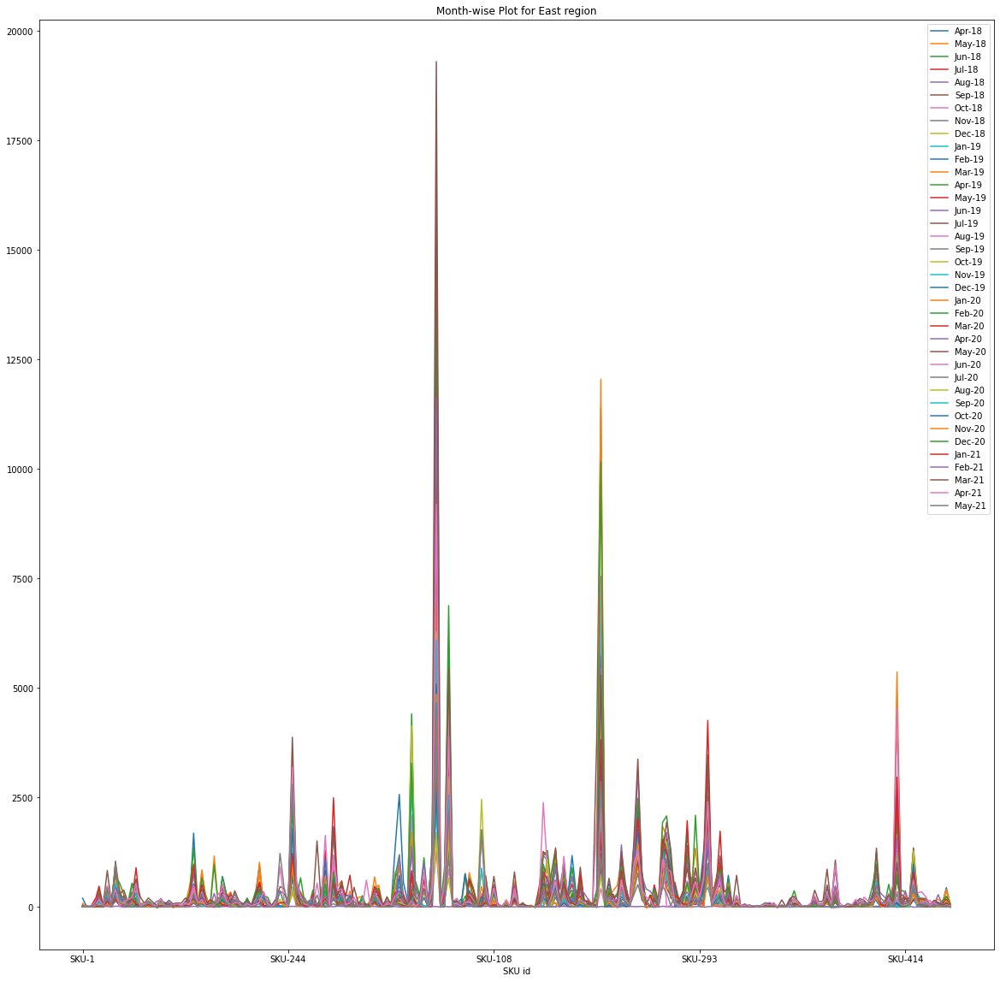

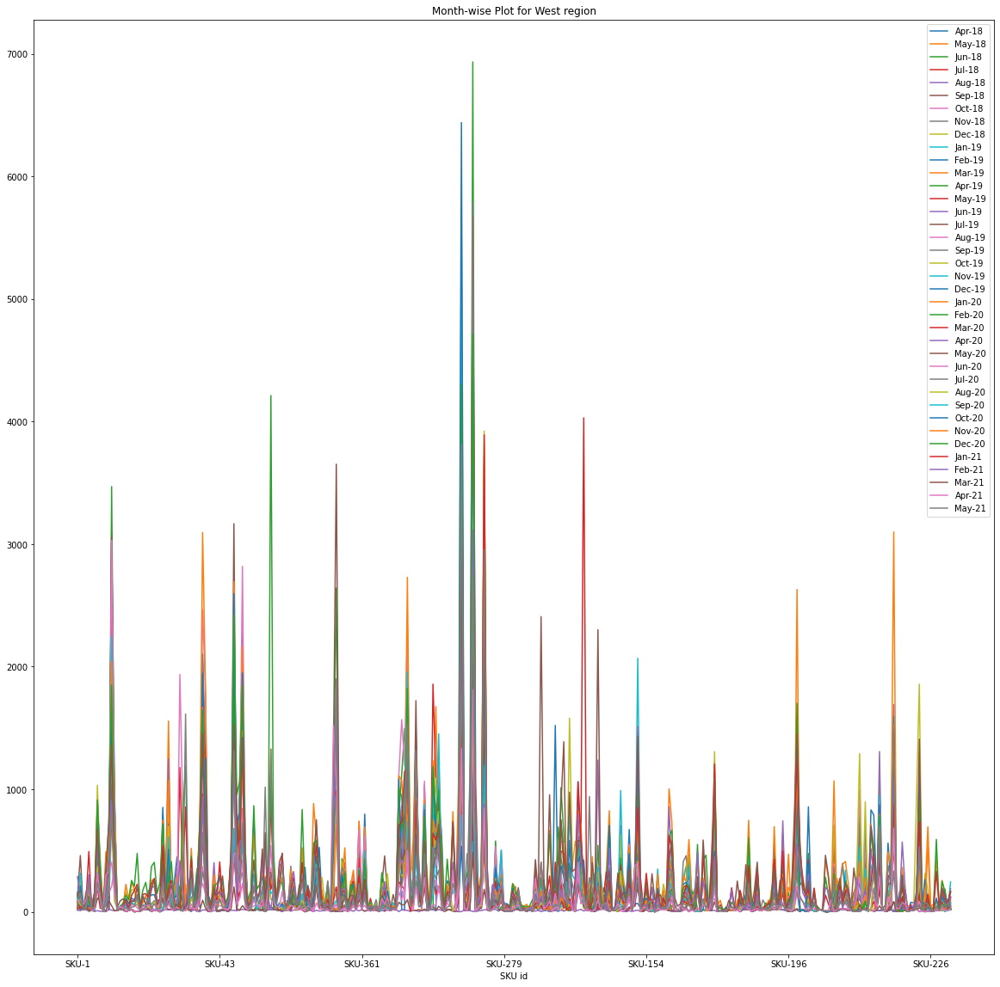

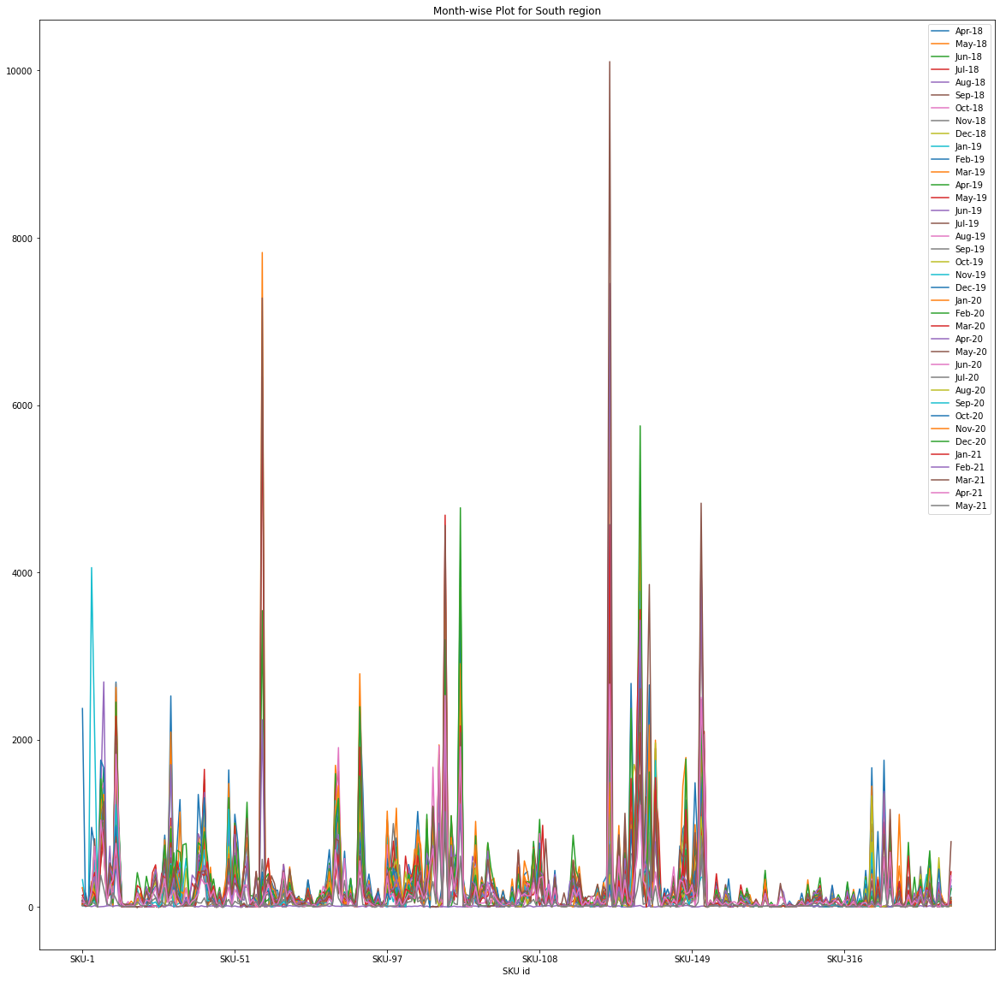

In [ ]:
df_N = df.where(df["Region"] == "NORTH")
df_N = df_N.dropna()
df_N.plot(x="SKU id",y=['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 
            'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 
            'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'],figsize=(20,20),title="Month-wise Plot for North region")

df_E = df.where(df["Region"] == "EAST")
df_E = df_E.dropna()
df_E.plot(x="SKU id",y=['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 
            'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 
            'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'],figsize=(20,20),title="Month-wise Plot for East region")

df_W = df.where(df["Region"] == "WEST")
df_W = df_W.dropna()
df_W.plot(x="SKU id",y=['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 
            'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 
            'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'],figsize=(20,20),title="Month-wise Plot for West region")

df_S = df.where(df["Region"] == "SOUTH")
df_S = df_S.dropna()
df_S.plot(x="SKU id",y=['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 
            'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 
            'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'],figsize=(20,20),title="Month-wise Plot for South region")

#for col in ['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
#            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 
#            'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 
#            'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
#            'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']:

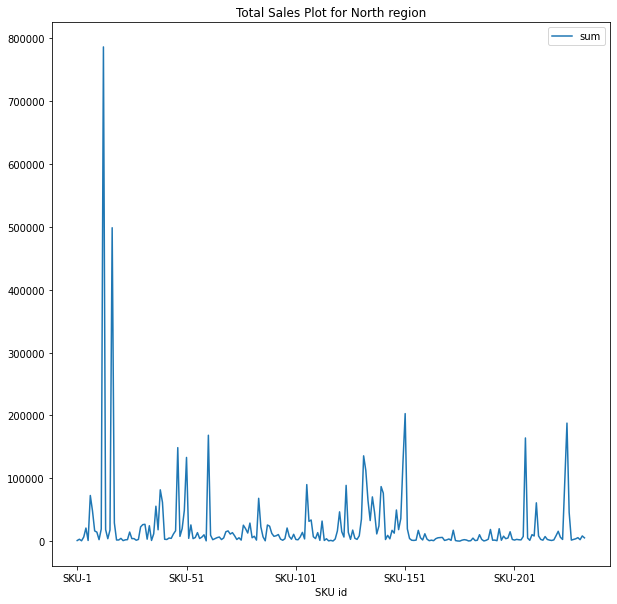

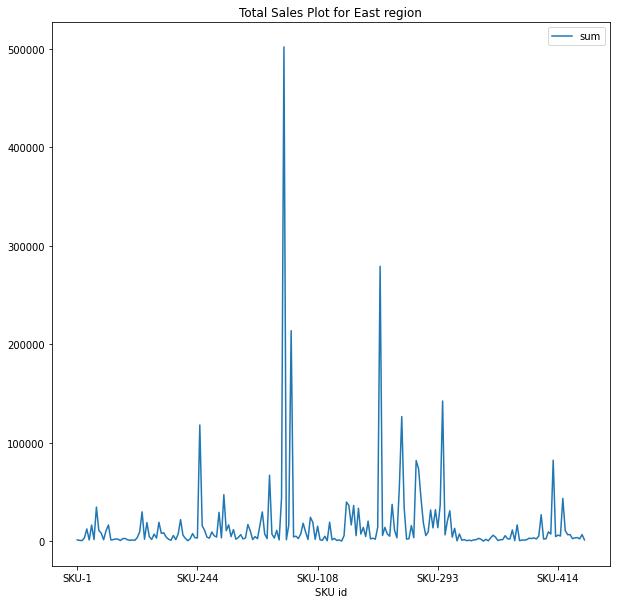

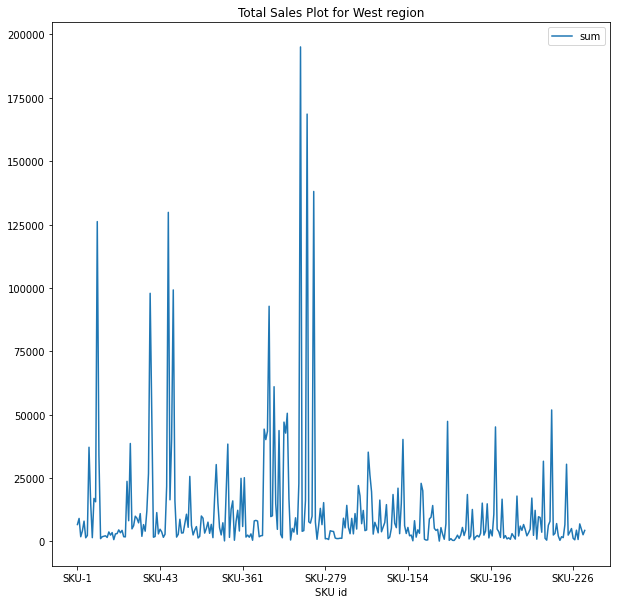

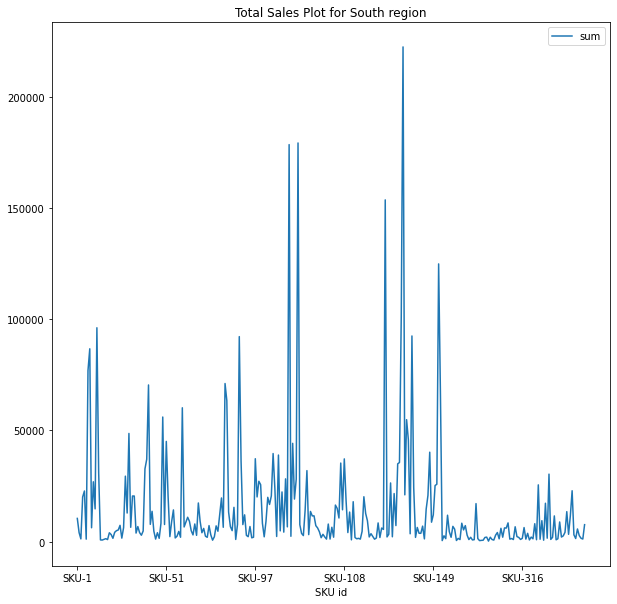

In [ ]:
df_N.plot(x="SKU id",y="sum",figsize=(10,10),title="Total Sales Plot for North region")
df_E.plot(x="SKU id",y="sum",figsize=(10,10),title="Total Sales Plot for East region")
df_W.plot(x="SKU id",y="sum",figsize=(10,10),title="Total Sales Plot for West region")
df_S.plot(x="SKU id",y="sum",figsize=(10,10),title="Total Sales Plot for South region")

SKU id,SKU-1,SKU-2,SKU-3,SKU-4,SKU-5,SKU-6,SKU-7,SKU-8,SKU-9,SKU-10,...,SKU-224,SKU-225,SKU-226,SKU-227,SKU-228,SKU-229,SKU-230,SKU-231,SKU-232,SKU-233
Apr-18,27.0,88.0,6.0,162.0,171.0,4.0,1179.0,406.0,264.0,8.0,...,101.0,817.0,308.0,17.0,17.0,4.0,253.0,26.0,297.0,91.0
May-18,13.0,28.0,6.0,184.0,402.0,4.0,435.0,652.0,244.0,8.0,...,365.0,669.0,224.0,17.0,17.0,4.0,298.0,92.0,151.0,31.0
Jun-18,30.0,127.0,6.0,110.0,627.0,4.0,335.0,844.0,159.0,8.0,...,821.0,1577.0,484.0,17.0,17.0,4.0,355.0,98.0,449.0,114.0
Jul-18,14.0,130.0,6.0,172.0,615.0,52.0,719.0,541.0,204.0,8.0,...,221.0,321.0,69.0,17.0,17.0,4.0,190.0,42.0,107.0,51.0
Aug-18,22.0,58.0,6.0,90.0,300.0,4.0,791.0,703.0,84.0,8.0,...,261.0,325.0,210.0,17.0,17.0,4.0,127.0,50.0,67.0,21.0


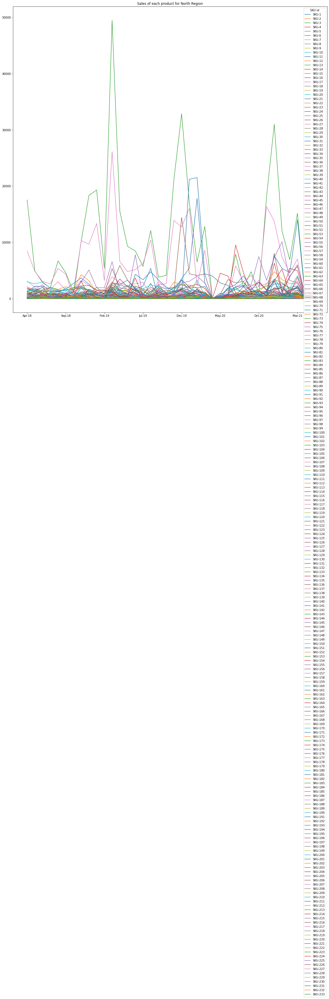

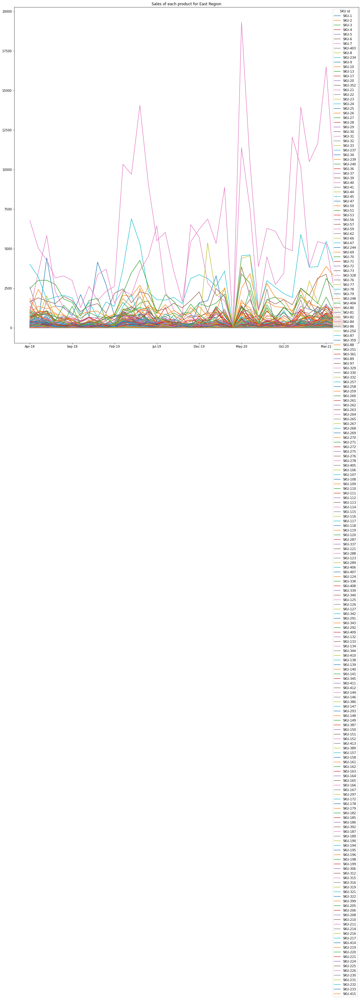

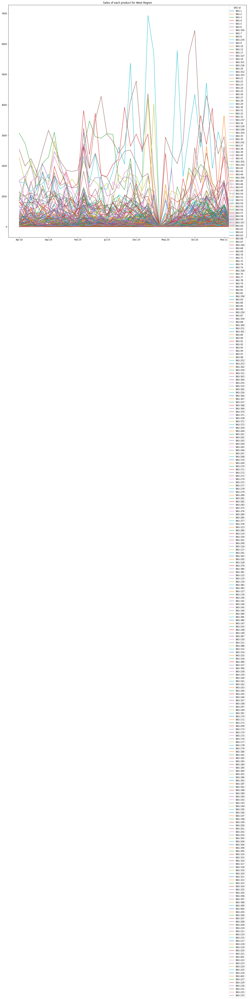

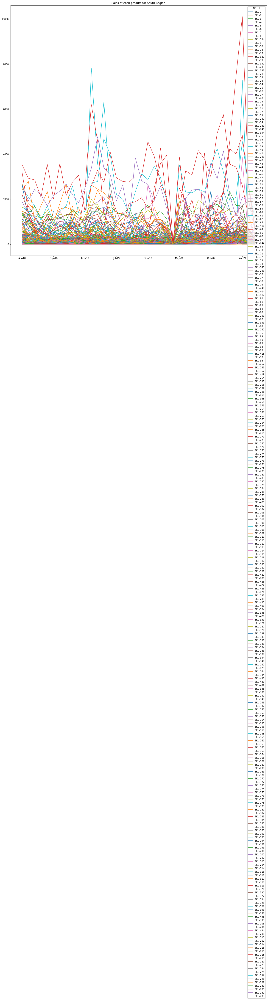

In [ ]:
df_N_T = df_N.set_index('SKU id')
df_N_T.drop(["Warehouse id", "Region"], axis = 1, inplace = True)
df_N_T = df_N_T.T
df_N_T.drop(['sum','year1819','year1920','year2021'], inplace=True, axis=0)
df_N_T.plot(figsize=(20,20),title="Sales of each product for North Region")

df_E_T = df_E.set_index('SKU id')
df_E_T.drop(["Warehouse id", "Region"], axis = 1, inplace = True)
df_E_T = df_E_T.T
df_E_T.drop(['sum','year1819','year1920','year2021'], inplace=True, axis=0)
df_E_T.plot(figsize=(20,20),title="Sales of each product for East Region")

df_W_T = df_W.set_index('SKU id')
df_W_T.drop(["Warehouse id", "Region"], axis = 1, inplace = True)
df_W_T = df_W_T.T
df_W_T.drop(['sum','year1819','year1920','year2021'], inplace=True, axis=0)
df_W_T.plot(figsize=(20,20),title="Sales of each product for West Region")

df_S_T = df_S.set_index('SKU id')
df_S_T.drop(["Warehouse id", "Region"], axis = 1, inplace = True)
df_S_T = df_S_T.T
df_S_T.drop(['sum','year1819','year1920','year2021'], inplace=True, axis=0)
df_S_T.plot(figsize=(20,20),title="Sales of each product for South Region")

df_N_T.head()

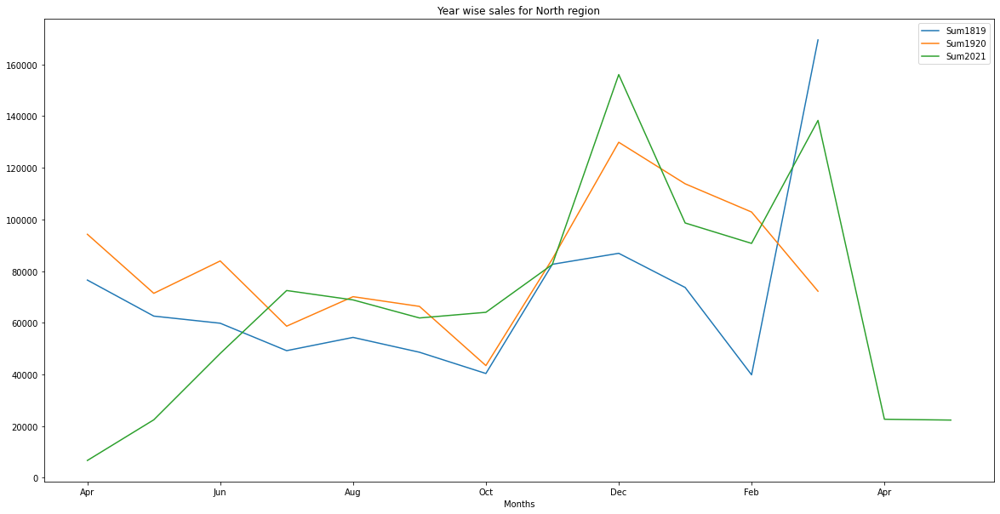

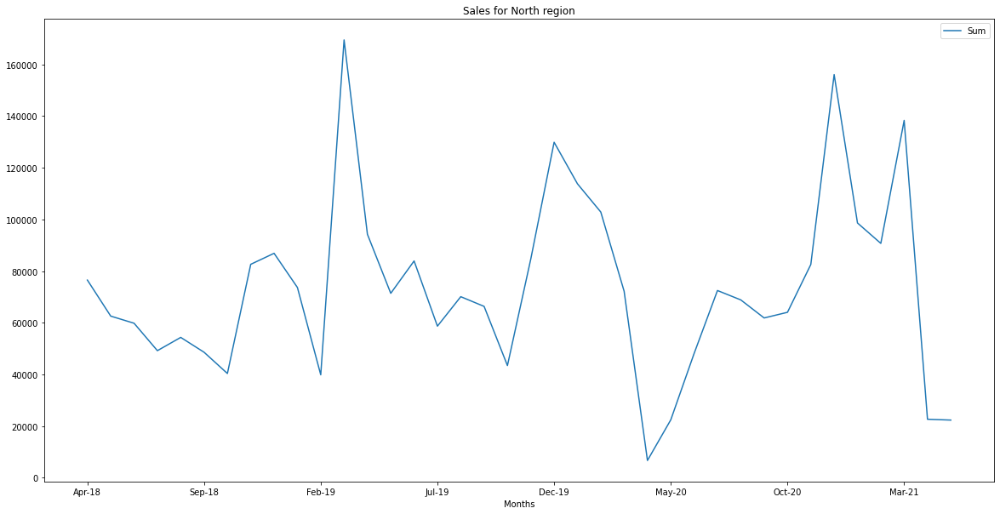

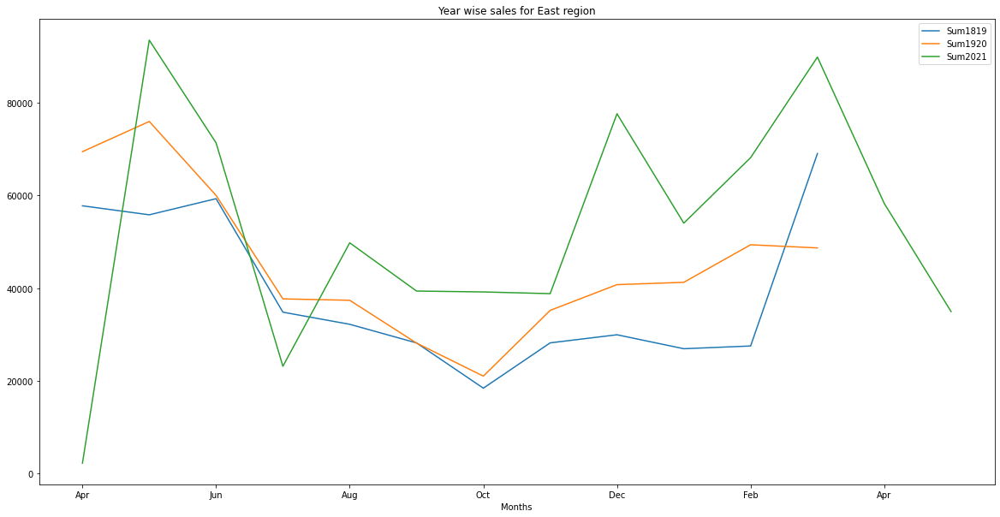

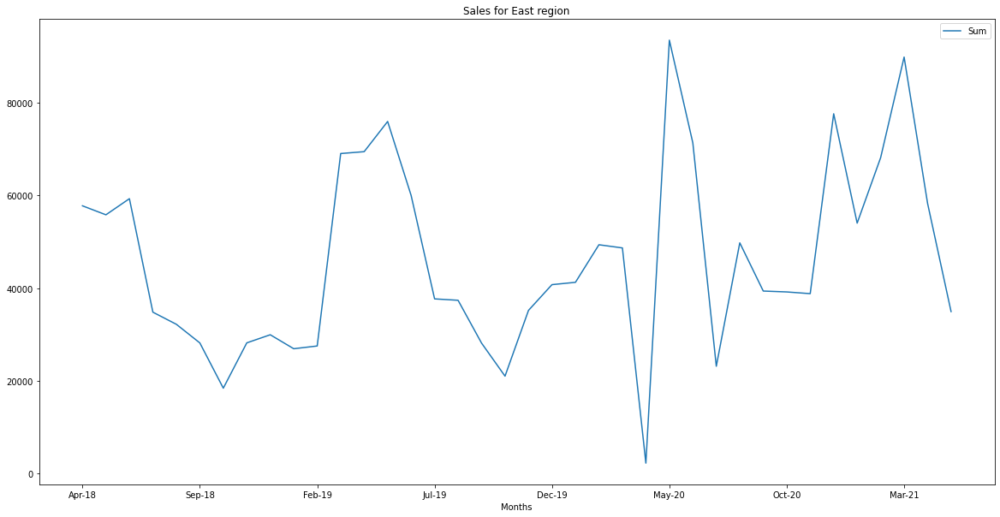

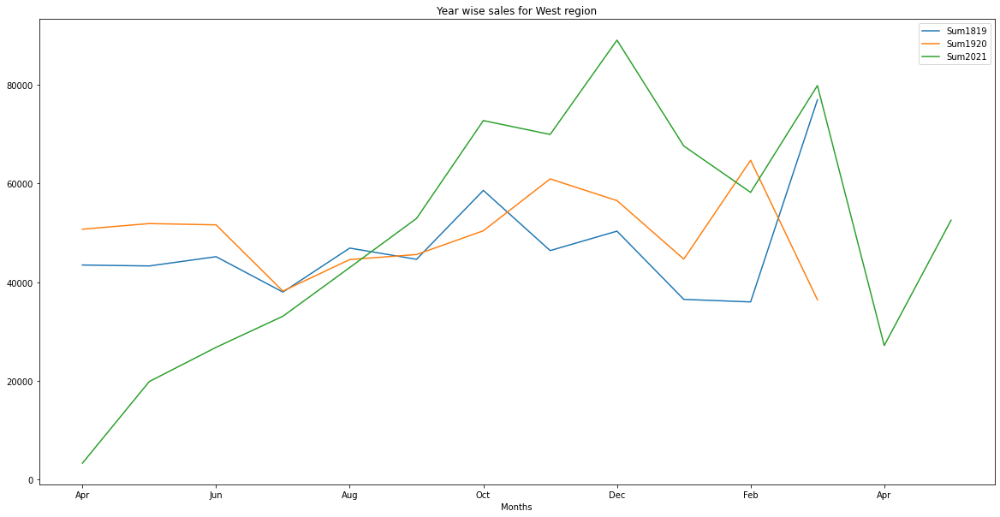

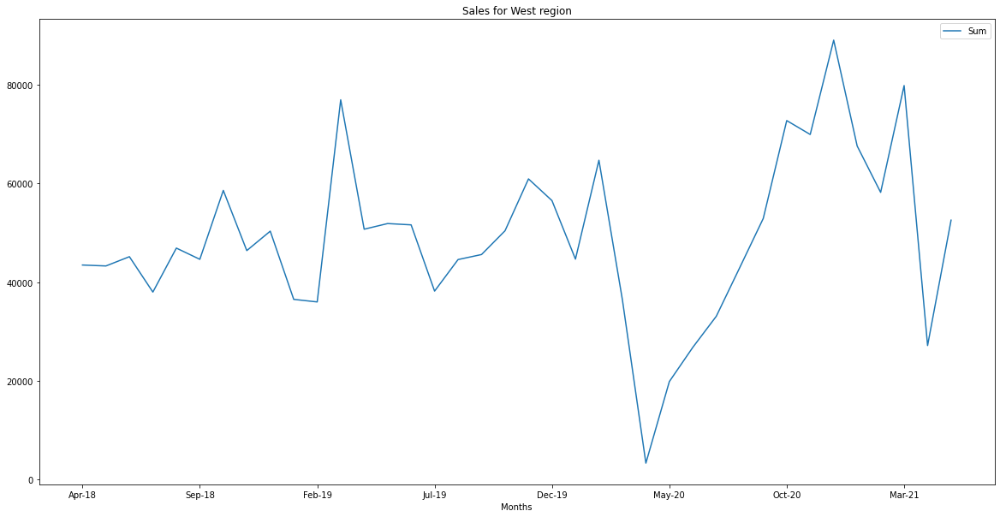

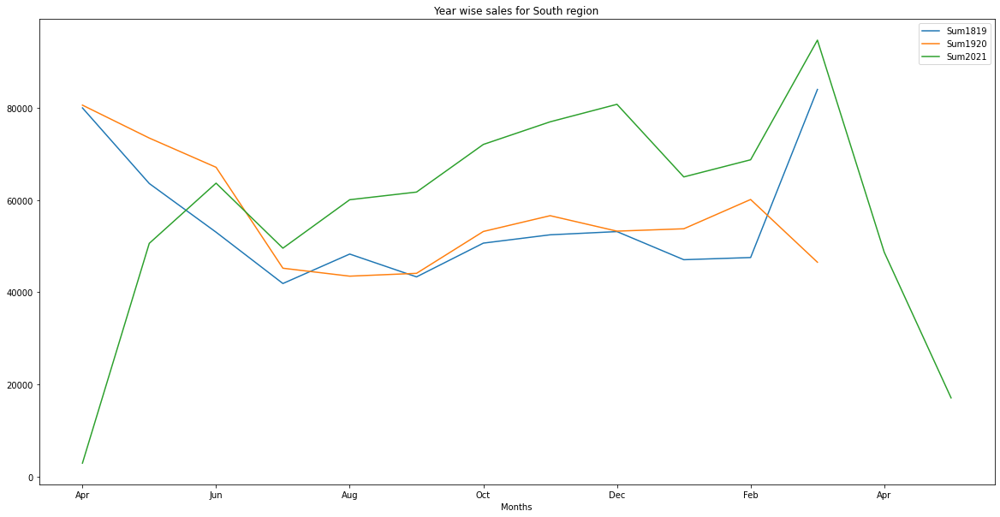

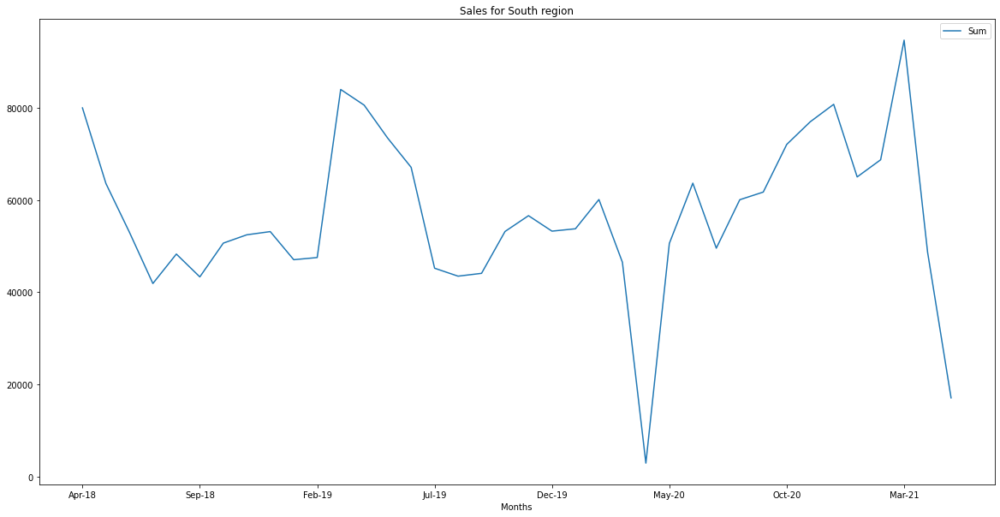

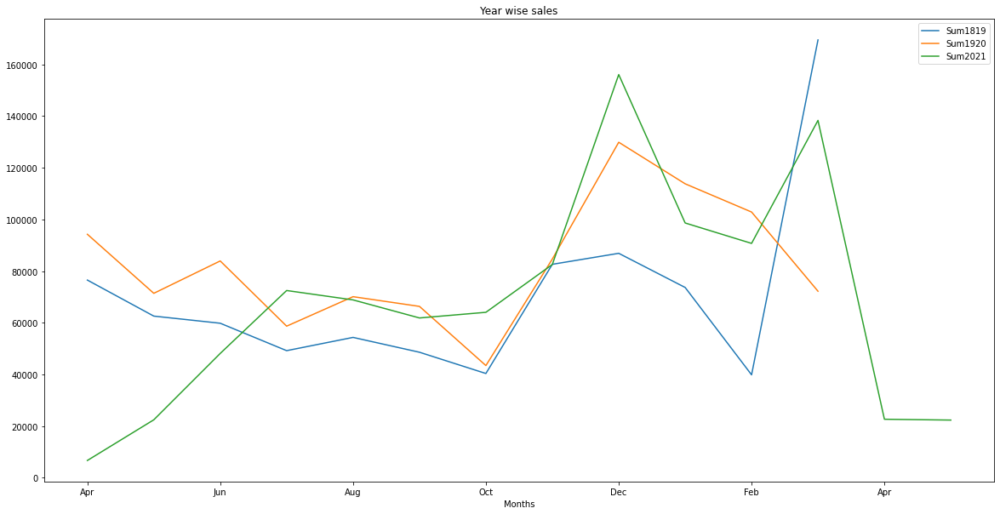

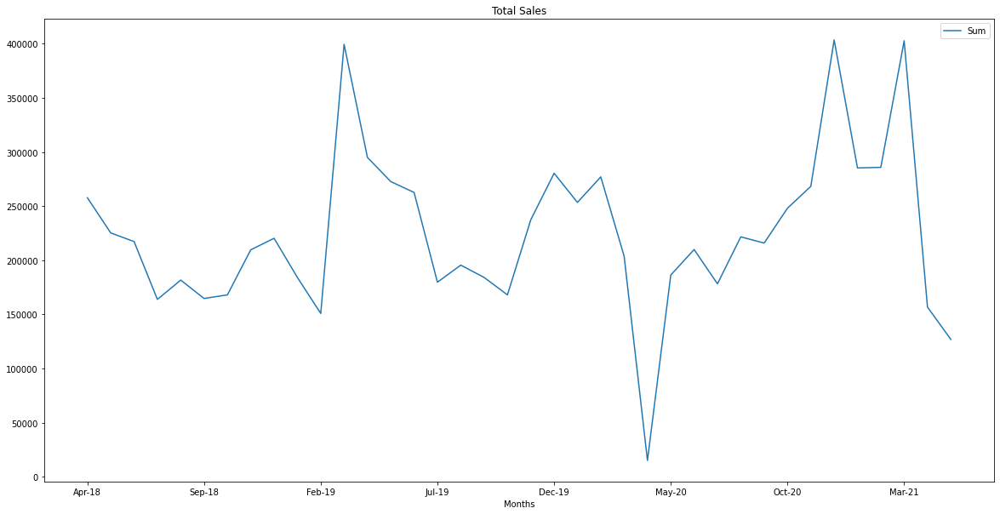

In [ ]:
# North Region
df_N_sum1819 = df_N[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']].sum(axis=0)
df_N_sum1819 = pd.DataFrame(df_N_sum1819, columns = ['Sum1819'])
df_N_sum1819['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_N_sum1819.set_index(['Months'],inplace=True)
ax_N = df_N_sum1819.plot(figsize=(20,10),title="Year wise sales for North region")

df_N_sum1920 = df_N[['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']].sum(axis=0)
df_N_sum1920 = pd.DataFrame(df_N_sum1920, columns = ['Sum1920'])
df_N_sum1920['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_N_sum1920.set_index(['Months'],inplace=True)
df_N_sum1920.plot(ax=ax_N)

df_N_sum2021 = df_N[['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_N_sum2021 = pd.DataFrame(df_N_sum2021, columns = ['Sum2021'])
df_N_sum2021['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May'])
df_N_sum2021.set_index(['Months'],inplace=True)
df_N_sum2021.plot(ax=ax_N)

df_N_sum = df_N[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_N_sum = pd.DataFrame(df_N_sum, columns = ['Sum'])
df_N_sum['Months'] = pd.Index(['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'])
df_N_sum.set_index(['Months'],inplace=True)
ax_n = df_N_sum.plot(figsize=(20,10),title="Sales for North region")


# East Region
df_E_sum1819 = df_E[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']].sum(axis=0)
df_E_sum1819 = pd.DataFrame(df_E_sum1819, columns = ['Sum1819'])
df_E_sum1819['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_E_sum1819.set_index(['Months'],inplace=True)
ax_E = df_E_sum1819.plot(figsize=(20,10),title="Year wise sales for East region")

df_E_sum1920 = df_E[['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']].sum(axis=0)
df_E_sum1920 = pd.DataFrame(df_E_sum1920, columns = ['Sum1920'])
df_E_sum1920['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_E_sum1920.set_index(['Months'],inplace=True)
df_E_sum1920.plot(ax=ax_E)

df_E_sum2021 = df_E[['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_E_sum2021 = pd.DataFrame(df_E_sum2021, columns = ['Sum2021'])
df_E_sum2021['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May'])
df_E_sum2021.set_index(['Months'],inplace=True)
df_E_sum2021.plot(ax=ax_E)

df_E_sum = df_E[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_E_sum = pd.DataFrame(df_E_sum, columns = ['Sum'])
df_E_sum['Months'] = pd.Index(['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'])
df_E_sum.set_index(['Months'],inplace=True)
ax_e = df_E_sum.plot(figsize=(20,10),title="Sales for East region")


# West Region
df_W_sum1819 = df_W[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']].sum(axis=0)
df_W_sum1819 = pd.DataFrame(df_W_sum1819, columns = ['Sum1819'])
df_W_sum1819['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_W_sum1819.set_index(['Months'],inplace=True)
ax_W = df_W_sum1819.plot(figsize=(20,10),title="Year wise sales for West region")

df_W_sum1920 = df_W[['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']].sum(axis=0)
df_W_sum1920 = pd.DataFrame(df_W_sum1920, columns = ['Sum1920'])
df_W_sum1920['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_W_sum1920.set_index(['Months'],inplace=True)
df_W_sum1920.plot(ax=ax_W)

df_W_sum2021 = df_W[['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_W_sum2021 = pd.DataFrame(df_W_sum2021, columns = ['Sum2021'])
df_W_sum2021['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May'])
df_W_sum2021.set_index(['Months'],inplace=True)
df_W_sum2021.plot(ax=ax_W)

df_W_sum = df_W[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_W_sum = pd.DataFrame(df_W_sum, columns = ['Sum'])
df_W_sum['Months'] = pd.Index(['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'])
df_W_sum.set_index(['Months'],inplace=True)
ax_w = df_W_sum.plot(figsize=(20,10),title="Sales for West region")


# South Region
df_S_sum1819 = df_S[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']].sum(axis=0)
df_S_sum1819 = pd.DataFrame(df_S_sum1819, columns = ['Sum1819'])
df_S_sum1819['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_S_sum1819.set_index(['Months'],inplace=True)
ax_S = df_S_sum1819.plot(figsize=(20,10),title="Year wise sales for South region")

df_S_sum1920 = df_S[['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']].sum(axis=0)
df_S_sum1920 = pd.DataFrame(df_S_sum1920, columns = ['Sum1920'])
df_S_sum1920['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_S_sum1920.set_index(['Months'],inplace=True)
df_S_sum1920.plot(ax=ax_S)

df_S_sum2021 = df_S[['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_S_sum2021 = pd.DataFrame(df_S_sum2021, columns = ['Sum2021'])
df_S_sum2021['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May'])
df_S_sum2021.set_index(['Months'],inplace=True)
df_S_sum2021.plot(ax=ax_S)

df_S_sum = df_S[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_S_sum = pd.DataFrame(df_S_sum, columns = ['Sum'])
df_S_sum['Months'] = pd.Index(['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'])
df_S_sum.set_index(['Months'],inplace=True)
ax_s = df_S_sum.plot(figsize=(20,10),title="Sales for South region")


# All Regions
df_sum1819 = df[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19']].sum(axis=0)
df_sum1819 = pd.DataFrame(df_N_sum1819, columns = ['Sum1819'])
df_sum1819['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_sum1819.set_index(['Months'],inplace=True)
ax = df_sum1819.plot(figsize=(20,10),title="Year wise sales")

df_sum1920 = df[['Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20']].sum(axis=0)
df_sum1920 = pd.DataFrame(df_N_sum1920, columns = ['Sum1920'])
df_sum1920['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar'])
df_sum1920.set_index(['Months'],inplace=True)
df_sum1920.plot(ax=ax)

df_sum2021 = df[['Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_sum2021 = pd.DataFrame(df_N_sum2021, columns = ['Sum2021'])
df_sum2021['Months'] = pd.Index(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
            'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May'])
df_sum2021.set_index(['Months'],inplace=True)
df_sum2021.plot(ax=ax)

df_sum = df[['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21']].sum(axis=0)
df_sum = pd.DataFrame(df_sum, columns = ['Sum'])
df_sum['Months'] = pd.Index(['Apr-18', 'May-18', 'Jun-18', 'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 
            'Dec-18', 'Jan-19', 'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19', 'Sep-19', 'Oct-19', 'Nov-19', 
           'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20', 'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20', 'Nov-20', 
           'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21'])
df_sum.set_index(['Months'],inplace=True)
ax_sum = df_sum.plot(figsize=(20,10),title="Total Sales")

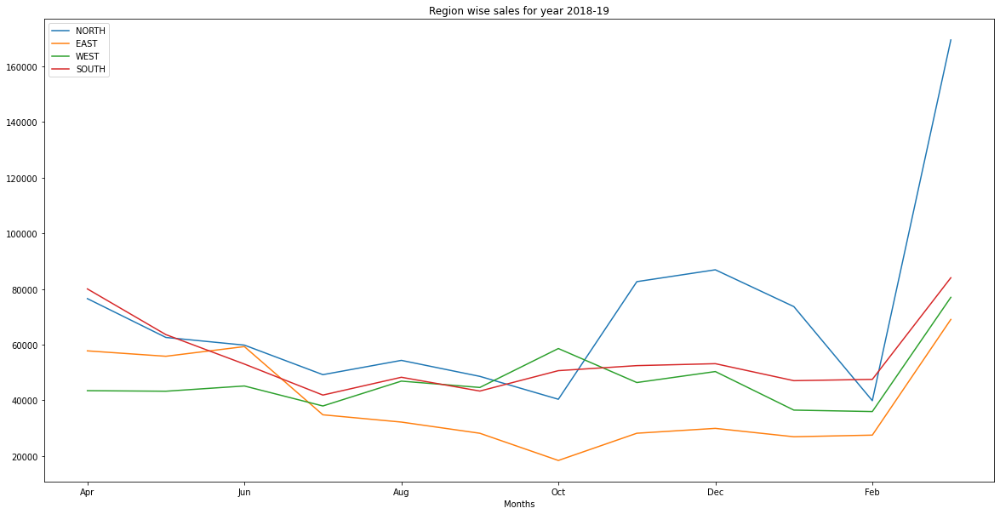

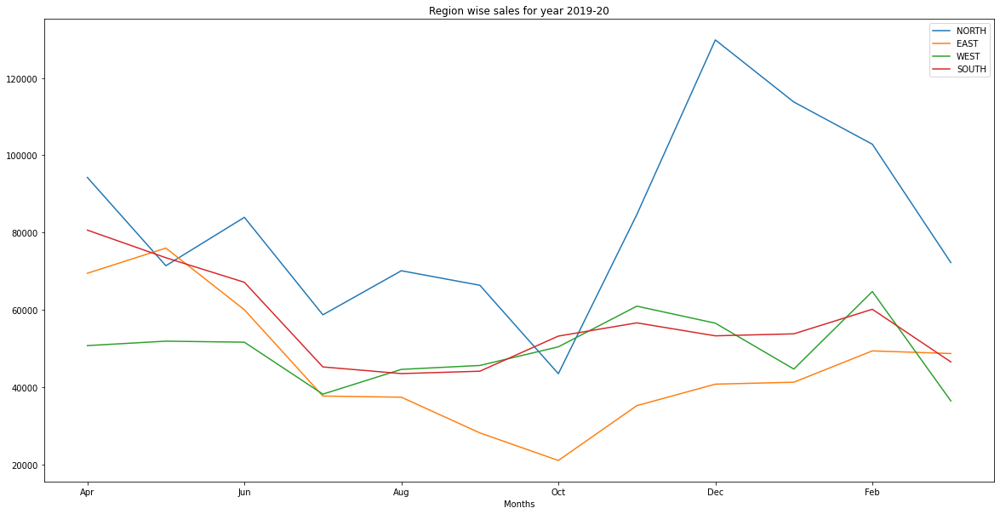

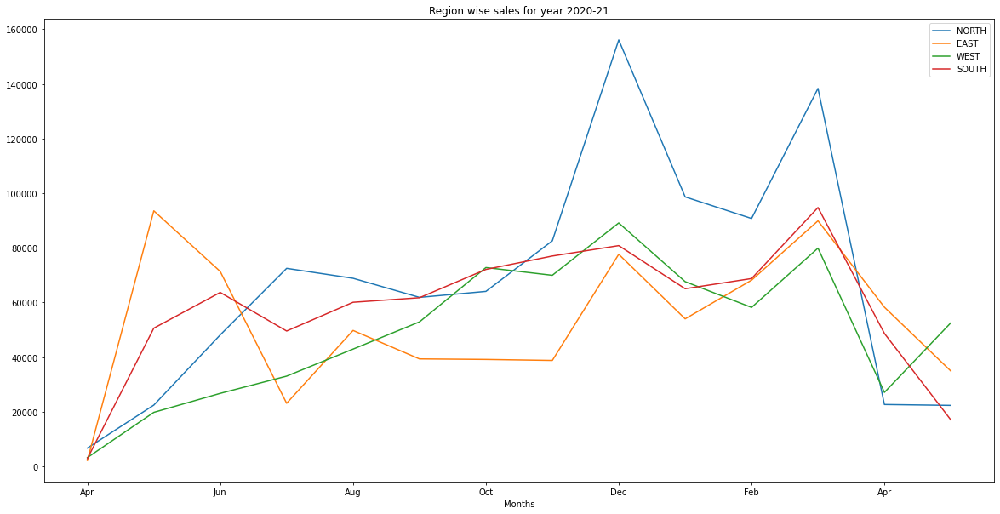

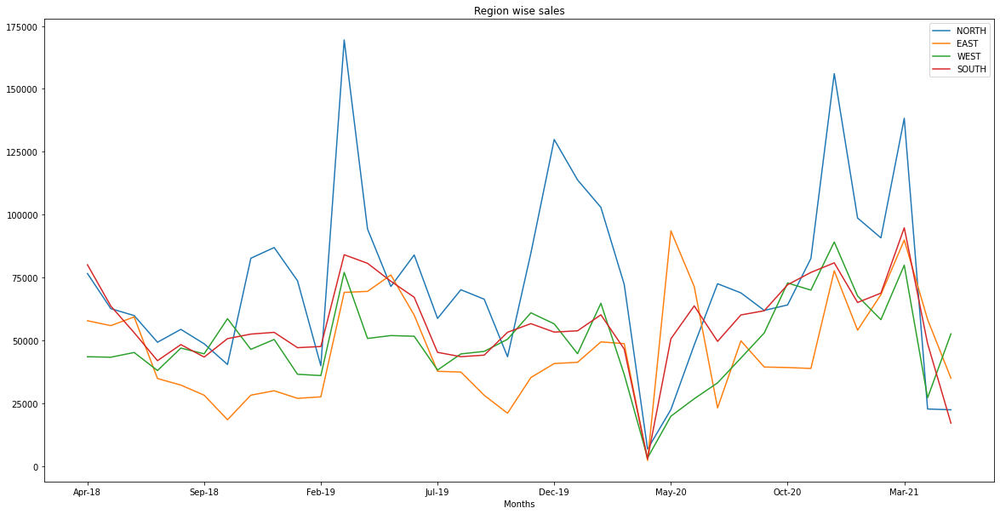

In [ ]:
ax_1819 = df_N_sum1819.plot(figsize=(20,10),title="Region wise sales for year 2018-19")
df_E_sum1819.plot(ax=ax_1819)
df_W_sum1819.plot(ax=ax_1819)
df_S_sum1819.plot(ax=ax_1819)
ax_1819.legend(['NORTH','EAST','WEST','SOUTH'])

ax_1920 = df_N_sum1920.plot(figsize=(20,10),title="Region wise sales for year 2019-20")
df_E_sum1920.plot(ax=ax_1920)
df_W_sum1920.plot(ax=ax_1920)
df_S_sum1920.plot(ax=ax_1920)
ax_1920.legend(['NORTH','EAST','WEST','SOUTH'])

ax_2021 = df_N_sum2021.plot(figsize=(20,10),title="Region wise sales for year 2020-21")
df_E_sum2021.plot(ax=ax_2021)
df_W_sum2021.plot(ax=ax_2021)
df_S_sum2021.plot(ax=ax_2021)
ax_2021.legend(['NORTH','EAST','WEST','SOUTH'])

ax_sum = df_N_sum.plot(figsize=(20,10),title="Region wise sales")
df_E_sum.plot(ax=ax_sum)
df_W_sum.plot(ax=ax_sum)
df_S_sum.plot(ax=ax_sum)
ax_sum.legend(['NORTH','EAST','WEST','SOUTH'])

#### Finding Popular Products

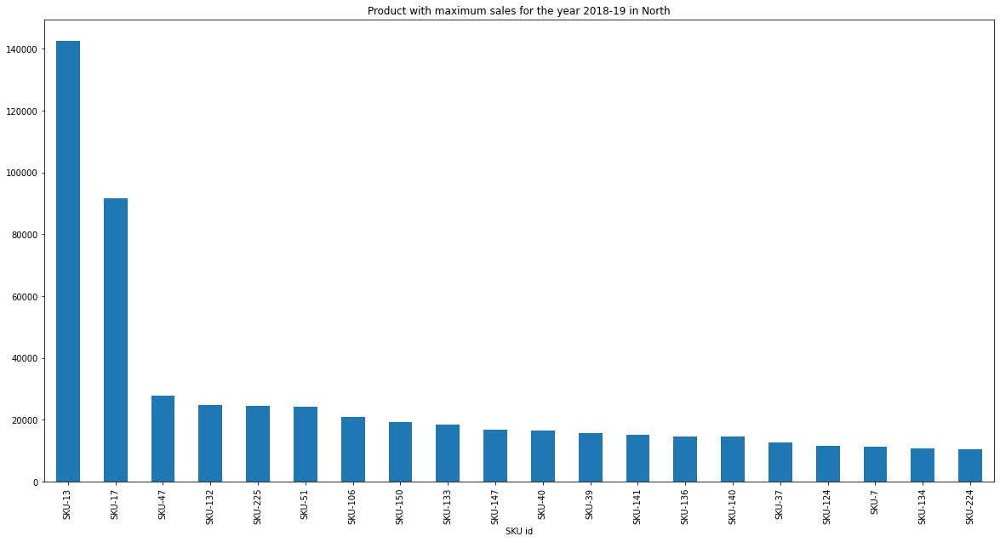

In [ ]:
north_1819=df_N.groupby('SKU id').sum().sort_values('year1819', ascending=False).head(20)['year1819']
north_1819.plot.bar(title="Product with maximum sales for the year 2018-19 in North",figsize=(20,10))

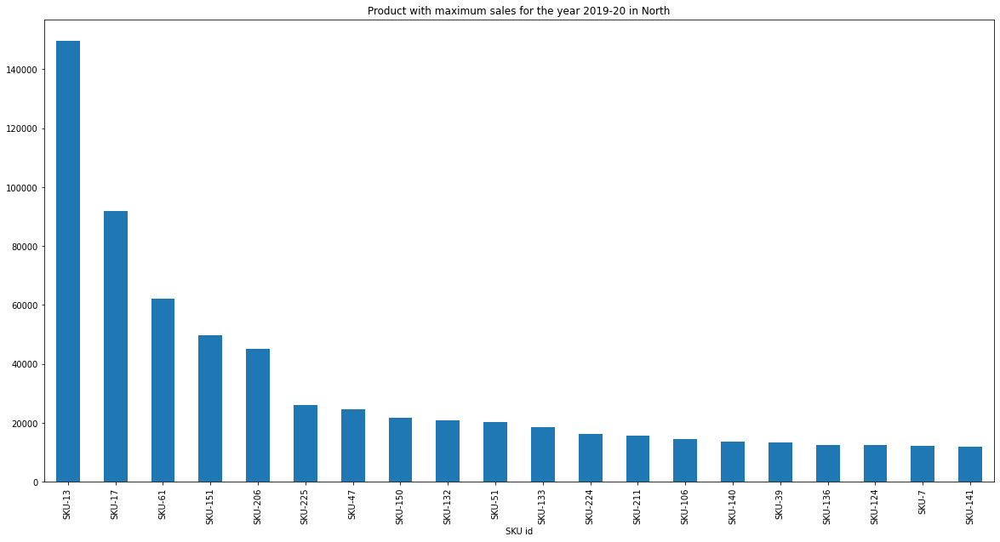

In [ ]:
north_1920=df_N.groupby('SKU id').sum().sort_values('year1920', ascending=False).head(20)['year1920']
north_1920.plot.bar(title="Product with maximum sales for the year 2019-20 in North",figsize=(20,10))

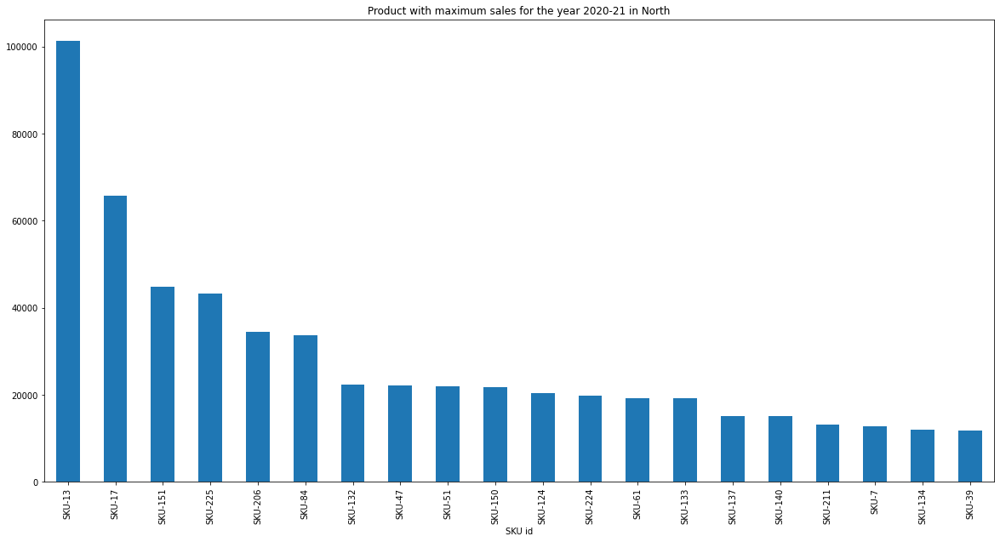

In [ ]:
north_2021=df_N.groupby('SKU id').sum().sort_values('year2021', ascending=False).head(20)['year2021']
north_2021.plot.bar(title="Product with maximum sales for the year 2020-21 in North",figsize=(20,10))

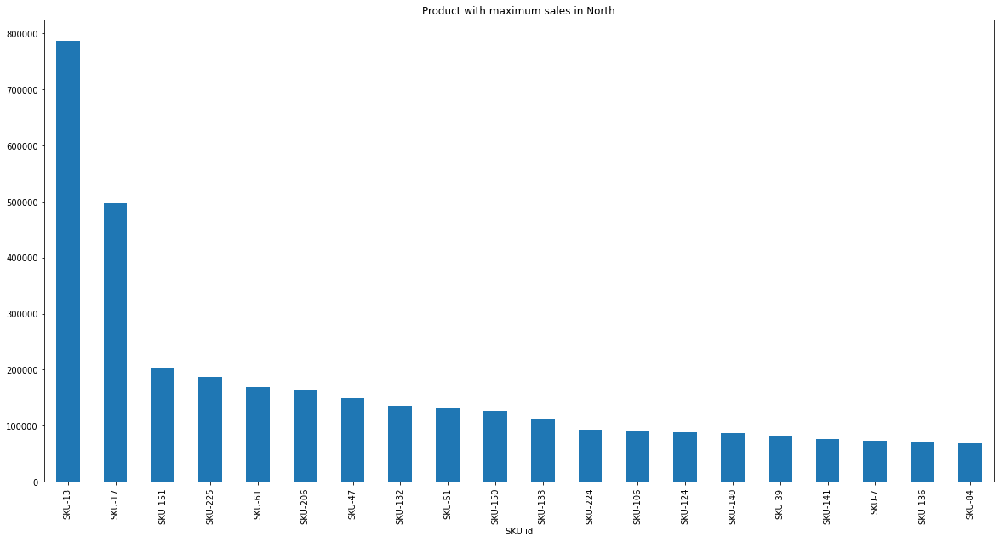

In [ ]:
north_total=df_N.groupby('SKU id').sum().sort_values('sum', ascending=False).head(20)['sum']
north_total.plot.bar(title="Product with maximum sales in North",figsize=(20,10))

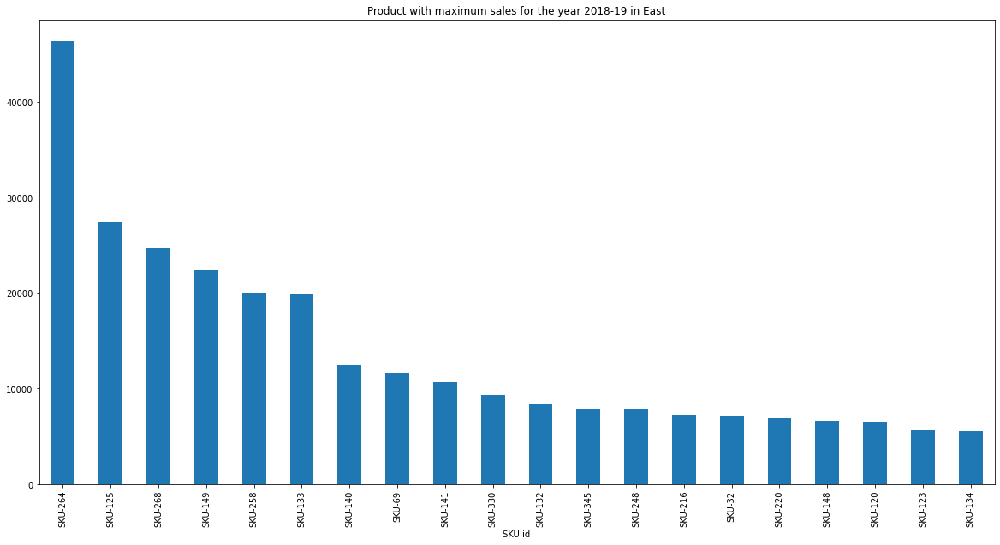

In [ ]:
east_1819=df_E.groupby('SKU id').sum().sort_values('year1819', ascending=False).head(20)['year1819']
east_1819.plot.bar(title="Product with maximum sales for the year 2018-19 in East",figsize=(20,10))

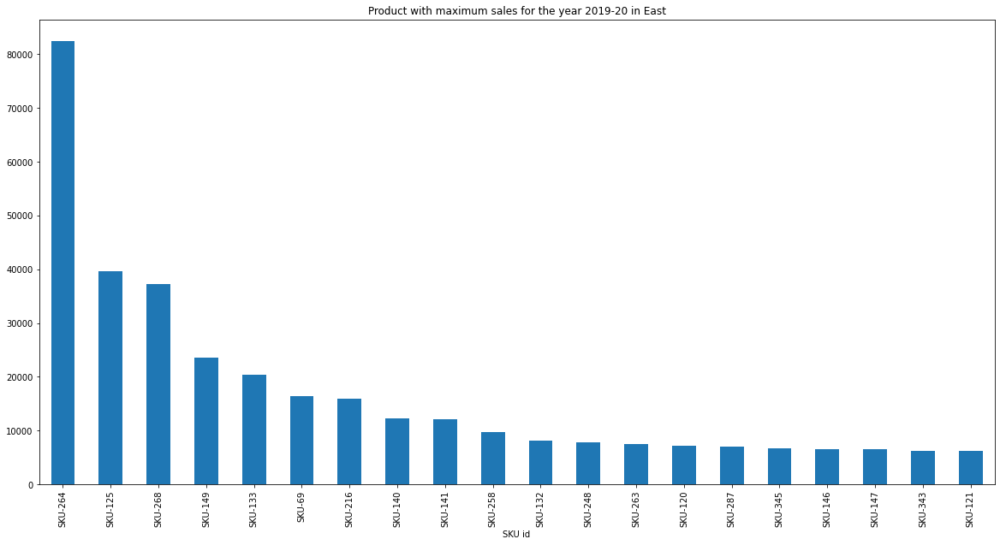

In [ ]:
east_1920=df_E.groupby('SKU id').sum().sort_values('year1920', ascending=False).head(20)['year1920']
east_1920.plot.bar(title="Product with maximum sales for the year 2019-20 in East",figsize=(20,10))

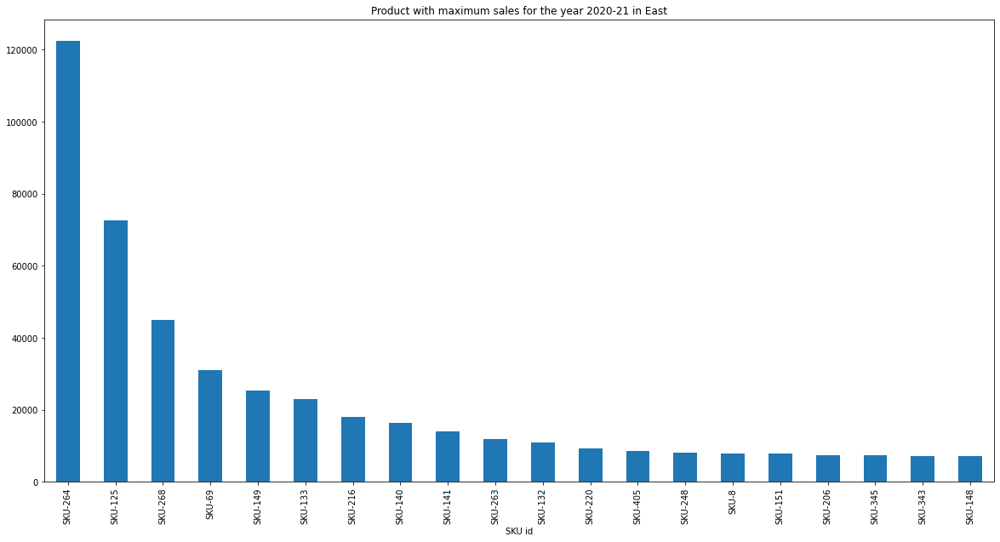

In [ ]:
east_2021=df_E.groupby('SKU id').sum().sort_values('year2021', ascending=False).head(20)['year2021']
east_2021.plot.bar(title="Product with maximum sales for the year 2020-21 in East",figsize=(20,10))

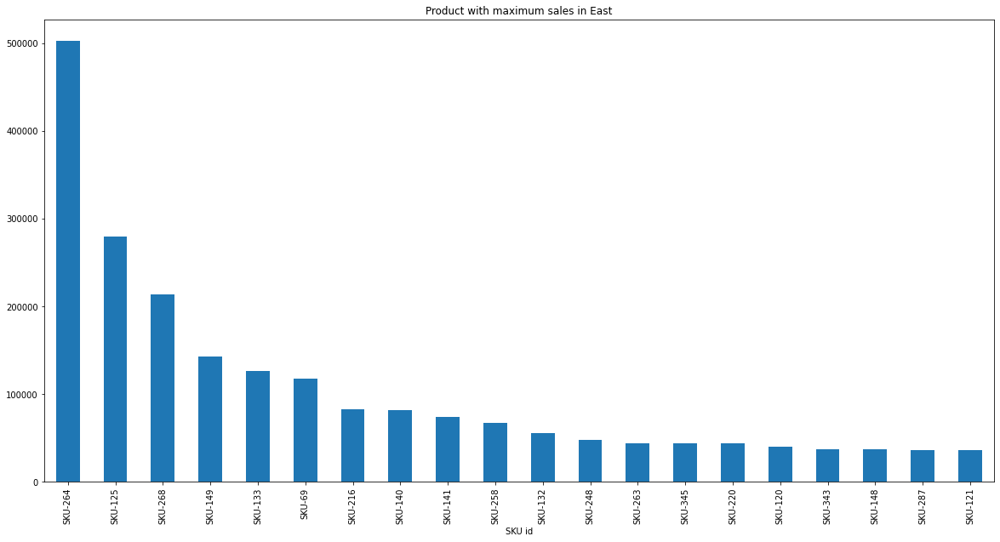

In [ ]:
east_total=df_E.groupby('SKU id').sum().sort_values('sum', ascending=False).head(20)['sum']
east_total.plot.bar(title="Product with maximum sales in East",figsize=(20,10))

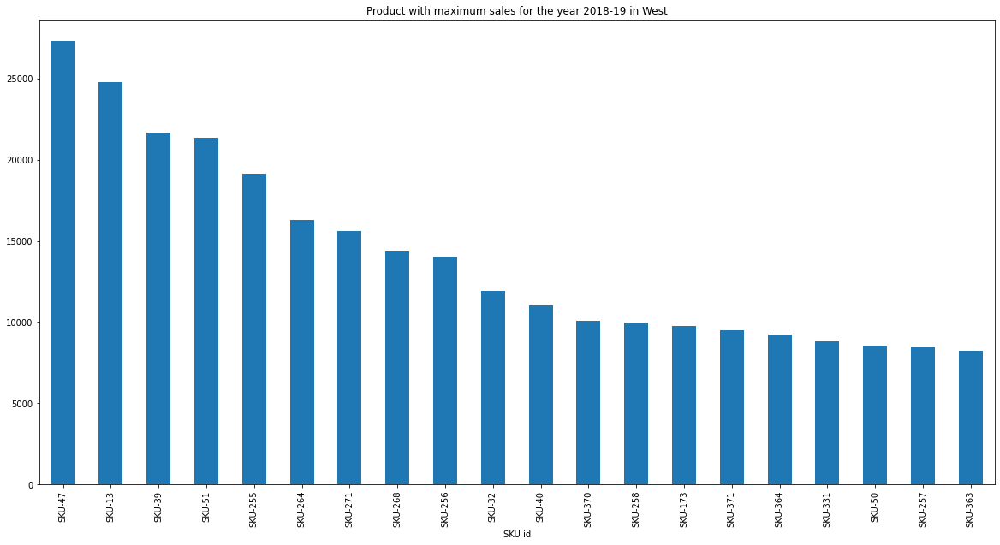

In [ ]:
west_1819=df_W.groupby('SKU id').sum().sort_values('year1819', ascending=False).head(20)['year1819']
west_1819.plot.bar(title="Product with maximum sales for the year 2018-19 in West",figsize=(20,10))

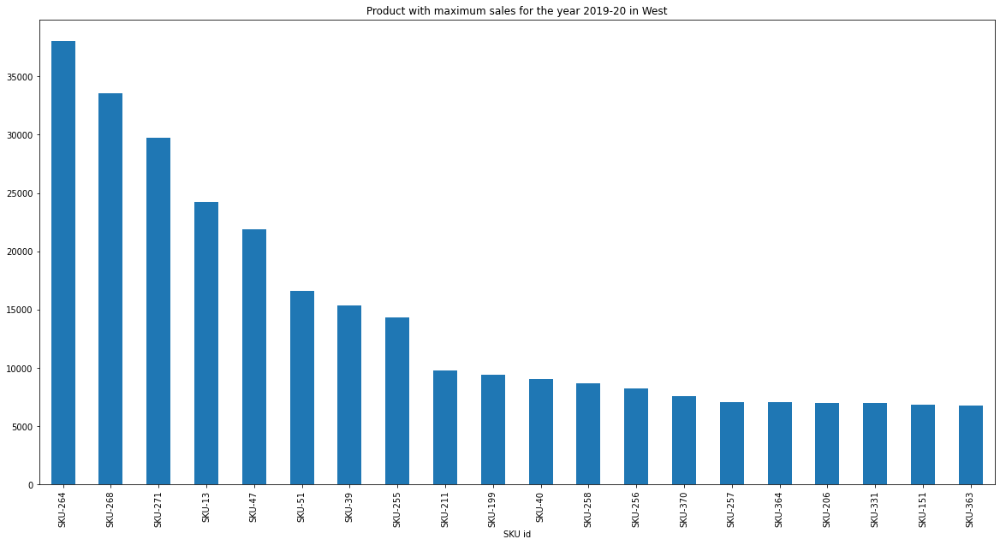

In [ ]:
west_1920=df_W.groupby('SKU id').sum().sort_values('year1920', ascending=False).head(20)['year1920']
west_1920.plot.bar(title="Product with maximum sales for the year 2019-20 in West",figsize=(20,10))

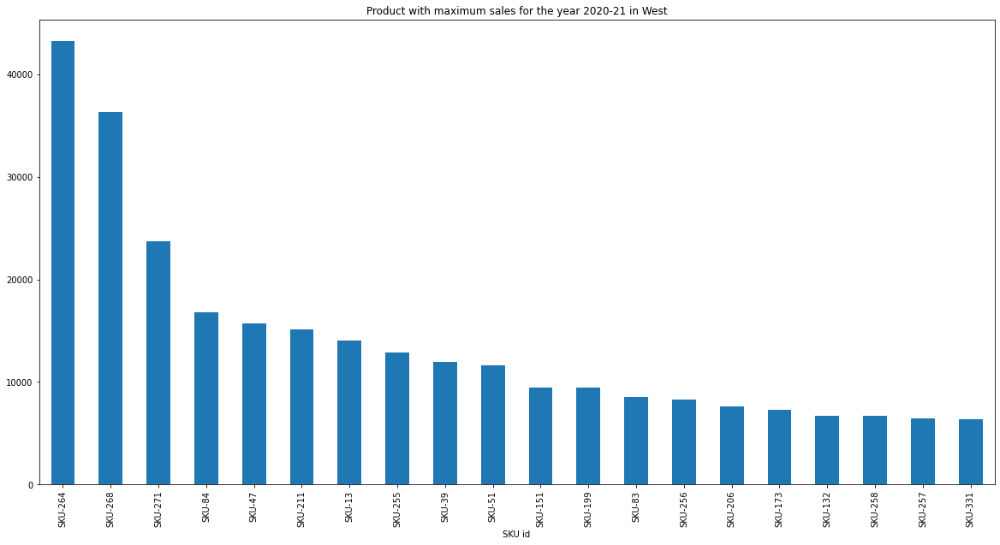

In [ ]:
west_2021=df_W.groupby('SKU id').sum().sort_values('year2021', ascending=False).head(20)['year2021']
west_2021.plot.bar(title="Product with maximum sales for the year 2020-21 in West",figsize=(20,10))

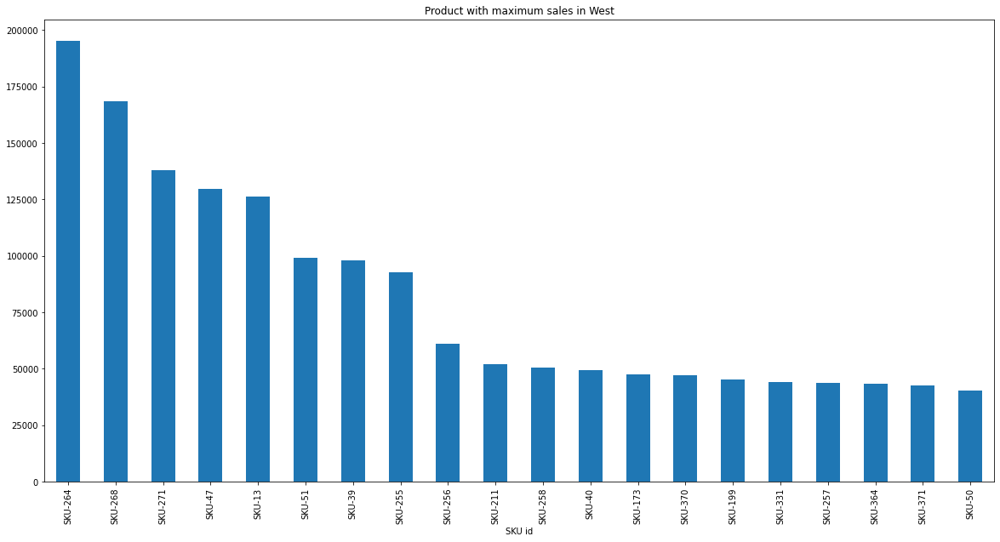

In [ ]:
west_total=df_W.groupby('SKU id').sum().sort_values('sum', ascending=False).head(20)['sum']
west_total.plot.bar(title="Product with maximum sales in West",figsize=(20,10))

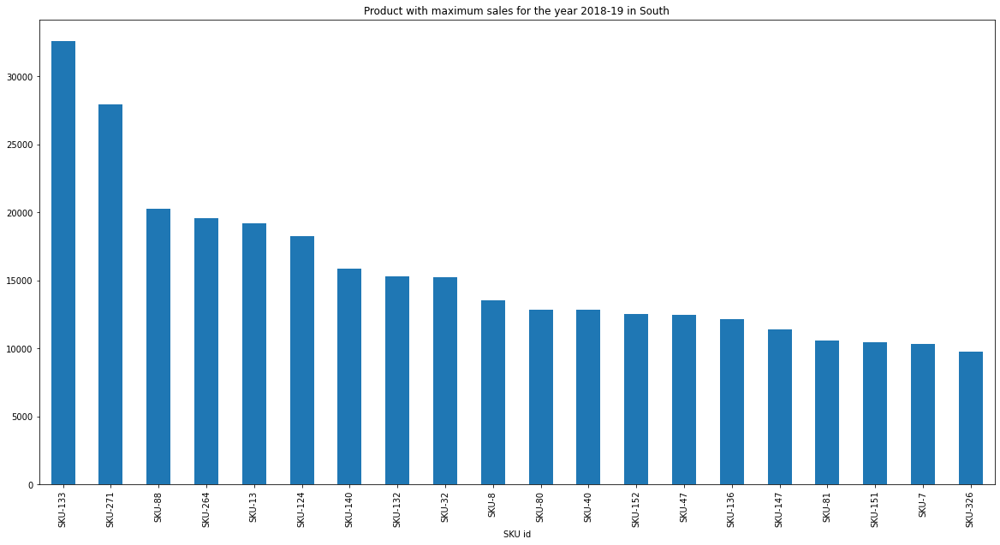

In [ ]:
south_1819=df_S.groupby('SKU id').sum().sort_values('year1819', ascending=False).head(20)['year1819']
south_1819.plot.bar(title="Product with maximum sales for the year 2018-19 in South",figsize=(20,10))

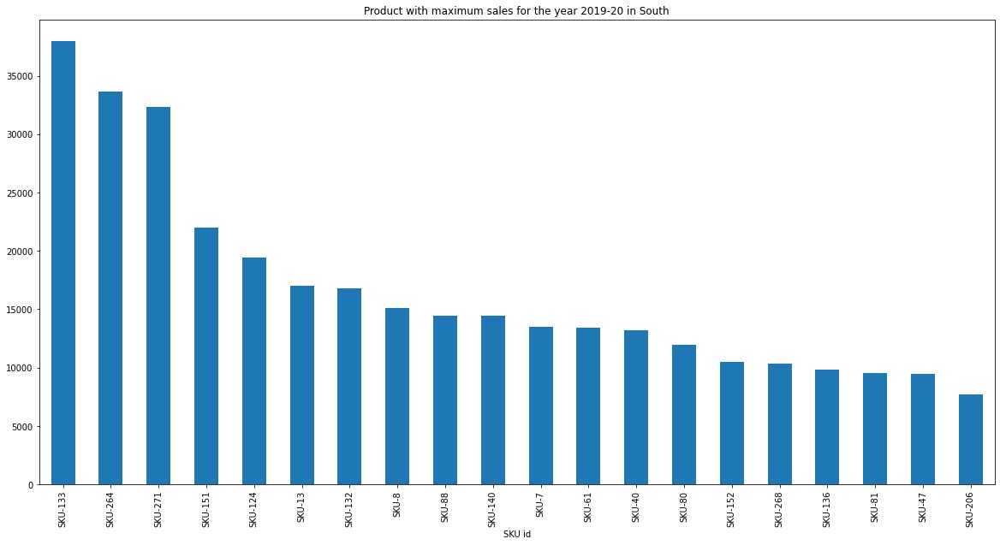

In [ ]:
south_1920=df_S.groupby('SKU id').sum().sort_values('year1920', ascending=False).head(20)['year1920']
south_1920.plot.bar(title="Product with maximum sales for the year 2019-20 in South",figsize=(20,10))

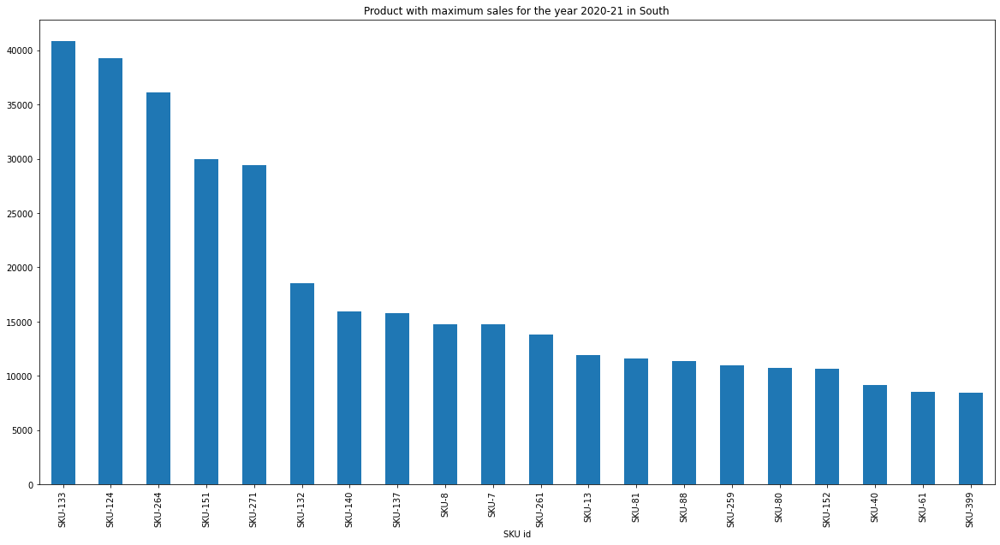

In [ ]:
south_2021=df_S.groupby('SKU id').sum().sort_values('year2021', ascending=False).head(20)['year2021']
south_2021.plot.bar(title="Product with maximum sales for the year 2020-21 in South",figsize=(20,10))

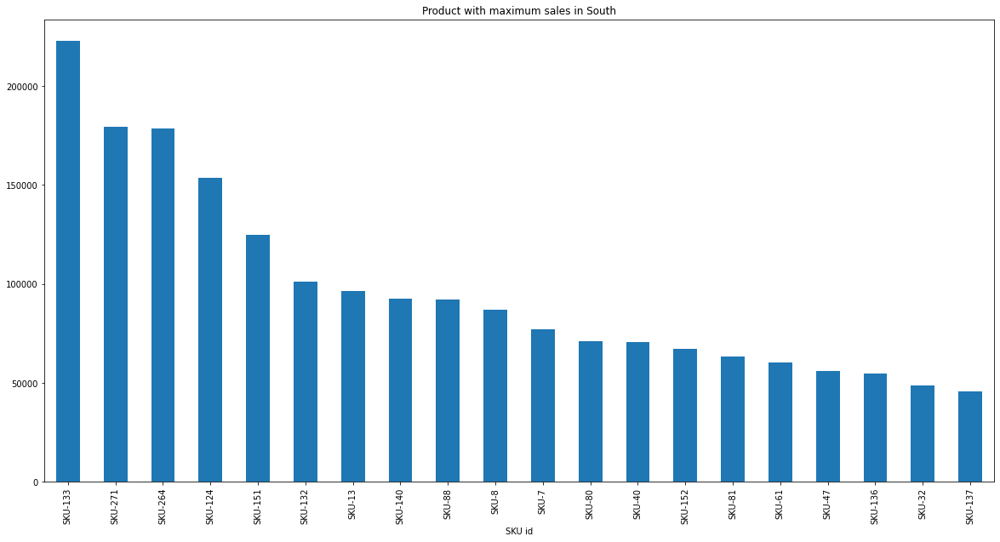

In [ ]:
south_total=df_S.groupby('SKU id').sum().sort_values('sum', ascending=False).head(20)['sum']
south_total.plot.bar(title="Product with maximum sales in South",figsize=(20,10))

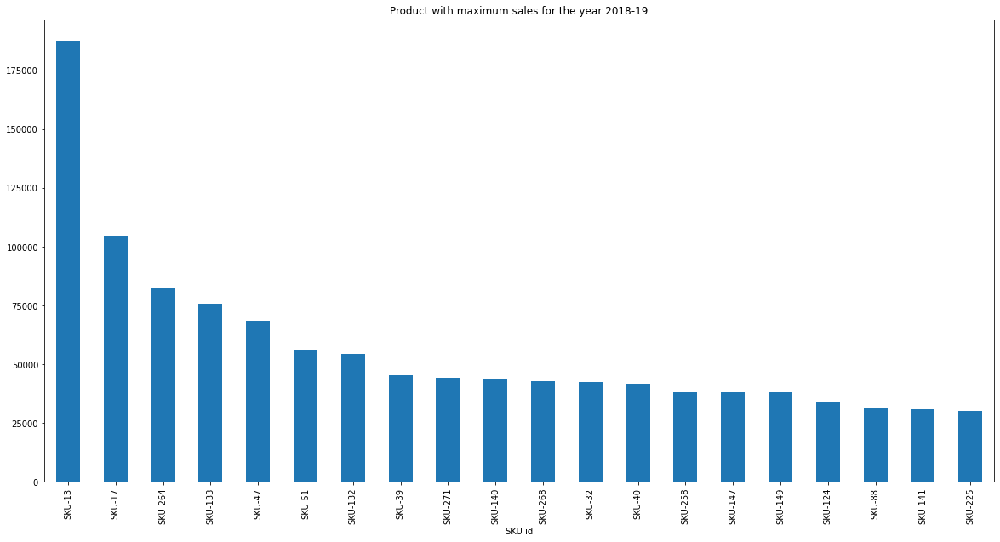

In [ ]:
total=df.groupby('SKU id').sum().sort_values('year1819', ascending=False).head(20)['year1819']
total.plot.bar(title="Product with maximum sales for the year 2018-19",figsize=(20,10))

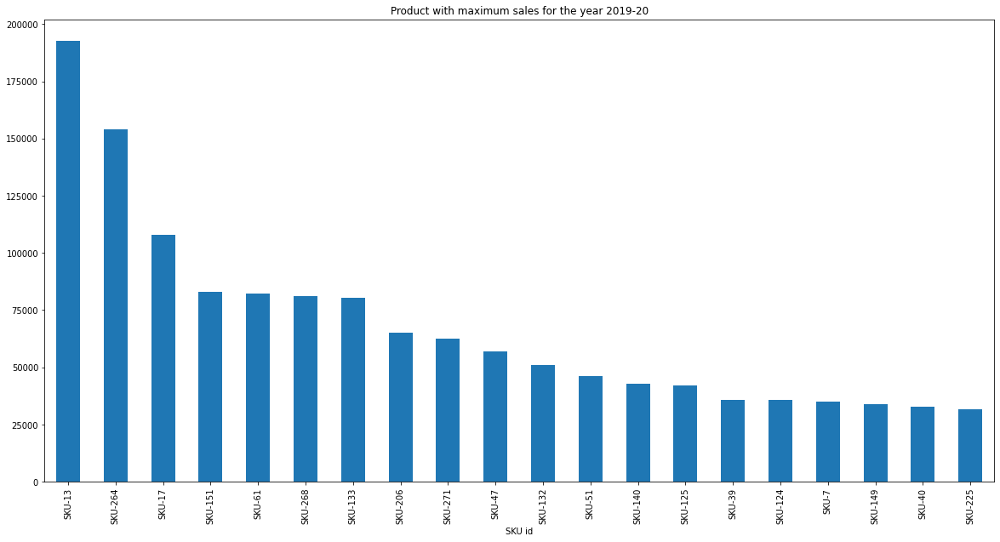

In [ ]:
total=df.groupby('SKU id').sum().sort_values('year1920', ascending=False).head(20)['year1920']
total.plot.bar(title="Product with maximum sales for the year 2019-20",figsize=(20,10))

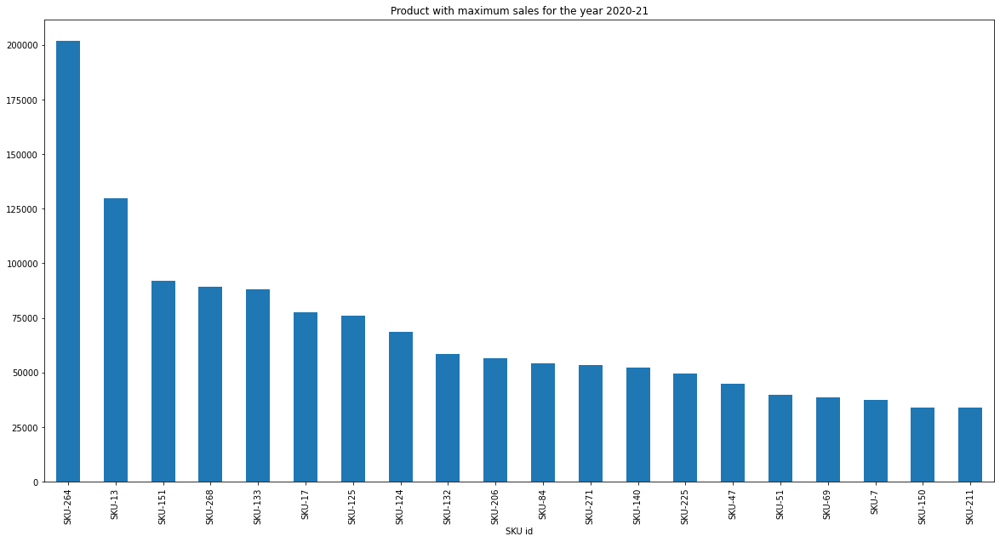

In [ ]:
total=df.groupby('SKU id').sum().sort_values('year2021', ascending=False).head(20)['year2021']
total.plot.bar(title="Product with maximum sales for the year 2020-21",figsize=(20,10))

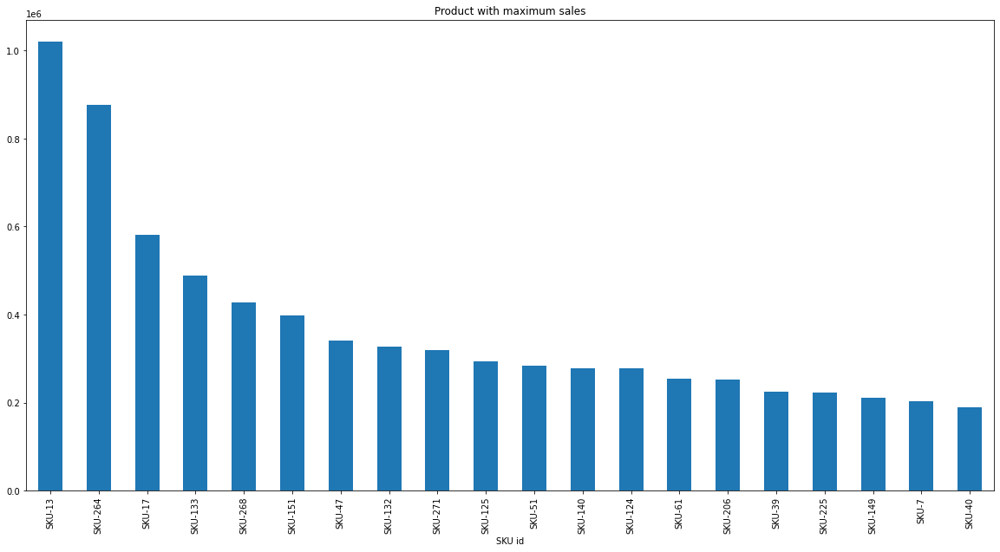

In [ ]:
total=df.groupby('SKU id').sum().sort_values('sum', ascending=False).head(20)['sum']
total.plot.bar(title="Product with maximum sales",figsize=(20,10))

In [ ]:
df['Average'] = df['sum']/38

df_N['Average'] = df_N['sum']/38
df_N['Popular1819'] = np.where(df_N['year1819']>40000, 1, 0)
df_N['Popular1920'] = np.where(df_N['year1920']>40000, 1, 0)
df_N['Popular2021'] = np.where(df_N['year2021']>40000, 1, 0)
df_N['Popular'] = np.where(df_N['sum']>200000, 1, 0)

df_E['Average'] = df_E['sum']/38
df_E['Popular1819'] = np.where(df_E['year1819']>20000, 1, 0)
df_E['Popular1920'] = np.where(df_E['year1920']>20000, 1, 0)
df_E['Popular2021'] = np.where(df_E['year2021']>20000, 1, 0)
df_E['Popular'] = np.where(df_E['sum']>100000, 1, 0)

df_W['Average'] = df_W['sum']/38
df_W['Popular1819'] = np.where(df_W['year1819']>20000, 1, 0)
df_W['Popular1920'] = np.where(df_W['year1920']>20000, 1, 0)
df_W['Popular2021'] = np.where(df_W['year2021']>20000, 1, 0)
df_W['Popular'] = np.where(df_W['sum']>100000, 1, 0)

df_S['Average'] = df_S['sum']/38
df_S['Popular1819'] = np.where(df_S['year1819']>20000, 1, 0)
df_S['Popular1920'] = np.where(df_S['year1920']>20000, 1, 0)
df_S['Popular2021'] = np.where(df_S['year2021']>20000, 1, 0)
df_S['Popular'] = np.where(df_S['sum']>100000, 1, 0)

In [ ]:
df_N.loc[df_N.Popular1819 == 1].sort_values('year1819', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
12,Wh-1,NORTH,SKU-13,17540.0,4896.0,2860.0,1900.0,6700.0,4604.0,1220.0,...,1020.0,142432.0,149500.0,101224.0,786312.0,20692.421053,1,1,1,1
16,Wh-1,NORTH,SKU-17,8458.0,4834.0,3066.0,2642.0,5362.0,4358.0,242.0,...,1202.0,91684.0,91984.0,65648.0,498632.0,13121.894737,1,1,1,1


In [ ]:
df_N.loc[df_N.Popular1920 == 1].sort_values('year1920', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
12,Wh-1,NORTH,SKU-13,17540.0,4896.0,2860.0,1900.0,6700.0,4604.0,1220.0,...,1020.0,142432.0,149500.0,101224.0,786312.0,20692.421053,1,1,1,1
16,Wh-1,NORTH,SKU-17,8458.0,4834.0,3066.0,2642.0,5362.0,4358.0,242.0,...,1202.0,91684.0,91984.0,65648.0,498632.0,13121.894737,1,1,1,1
60,Wh-1,NORTH,SKU-61,10.0,10.0,10.0,10.0,10.0,10.0,10.0,...,10.0,2880.0,62188.0,19176.0,168488.0,4433.894737,0,1,0,0
150,Wh-1,NORTH,SKU-151,772.0,1357.0,2005.0,286.0,430.0,118.0,280.0,...,400.0,7053.0,49611.0,44789.0,202906.0,5339.631579,0,1,1,1
205,Wh-1,NORTH,SKU-206,3.0,3.0,3.0,3.0,3.0,3.0,3.0,...,1195.0,2612.0,45080.0,34398.0,164180.0,4320.526316,0,1,0,0


In [ ]:
df_N.loc[df_N.Popular2021 == 1].sort_values('year2021', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
12,Wh-1,NORTH,SKU-13,17540.0,4896.0,2860.0,1900.0,6700.0,4604.0,1220.0,...,1020.0,142432.0,149500.0,101224.0,786312.0,20692.421053,1,1,1,1
16,Wh-1,NORTH,SKU-17,8458.0,4834.0,3066.0,2642.0,5362.0,4358.0,242.0,...,1202.0,91684.0,91984.0,65648.0,498632.0,13121.894737,1,1,1,1
150,Wh-1,NORTH,SKU-151,772.0,1357.0,2005.0,286.0,430.0,118.0,280.0,...,400.0,7053.0,49611.0,44789.0,202906.0,5339.631579,0,1,1,1
224,Wh-1,NORTH,SKU-225,817.0,669.0,1577.0,321.0,325.0,1007.0,1427.0,...,349.0,24650.0,26052.0,43190.0,187784.0,4941.684211,0,0,1,0


In [ ]:
df_N.loc[df_N.Popular == 1].sort_values('sum', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
12,Wh-1,NORTH,SKU-13,17540.0,4896.0,2860.0,1900.0,6700.0,4604.0,1220.0,...,1020.0,142432.0,149500.0,101224.0,786312.0,20692.421053,1,1,1,1
16,Wh-1,NORTH,SKU-17,8458.0,4834.0,3066.0,2642.0,5362.0,4358.0,242.0,...,1202.0,91684.0,91984.0,65648.0,498632.0,13121.894737,1,1,1,1
150,Wh-1,NORTH,SKU-151,772.0,1357.0,2005.0,286.0,430.0,118.0,280.0,...,400.0,7053.0,49611.0,44789.0,202906.0,5339.631579,0,1,1,1


In [ ]:
df_E.loc[df_E.Popular1819 == 1].sort_values('year1819', ascending=False)


,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
319,Wh-2,EAST,SKU-264,6787.0,5029.0,4273.0,3151.0,3271.0,2989.0,1279.0,...,4669.0,46350.0,82332.0,122372.0,502108.0,13213.368421,1,1,1,1
359,Wh-2,EAST,SKU-125,985.0,3497.0,5823.0,2319.0,1221.0,905.0,423.0,...,2873.0,27384.0,39616.0,72638.0,279276.0,7349.368421,1,1,1,1
322,Wh-2,EAST,SKU-268,4014.0,3210.0,1770.0,1935.0,2058.0,1878.0,867.0,...,2223.0,24693.0,37209.0,45054.0,213912.0,5629.263158,1,1,1,1
385,Wh-2,EAST,SKU-149,2476.0,2994.0,3000.0,2744.0,1820.0,1608.0,732.0,...,1000.0,22388.0,23512.0,25328.0,142456.0,3748.842105,1,1,1,1


In [ ]:
df_E.loc[df_E.Popular1920 == 1].sort_values('year1920', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
319,Wh-2,EAST,SKU-264,6787.0,5029.0,4273.0,3151.0,3271.0,2989.0,1279.0,...,4669.0,46350.0,82332.0,122372.0,502108.0,13213.368421,1,1,1,1
359,Wh-2,EAST,SKU-125,985.0,3497.0,5823.0,2319.0,1221.0,905.0,423.0,...,2873.0,27384.0,39616.0,72638.0,279276.0,7349.368421,1,1,1,1
322,Wh-2,EAST,SKU-268,4014.0,3210.0,1770.0,1935.0,2058.0,1878.0,867.0,...,2223.0,24693.0,37209.0,45054.0,213912.0,5629.263158,1,1,1,1
385,Wh-2,EAST,SKU-149,2476.0,2994.0,3000.0,2744.0,1820.0,1608.0,732.0,...,1000.0,22388.0,23512.0,25328.0,142456.0,3748.842105,1,1,1,1
368,Wh-2,EAST,SKU-133,1647.0,1887.0,1691.0,1523.0,1979.0,1715.0,1015.0,...,779.0,19924.0,20424.0,22962.0,126620.0,3332.105263,0,1,1,1


In [ ]:
df_E.loc[df_E.Popular2021 == 1].sort_values('year2021', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
319,Wh-2,EAST,SKU-264,6787.0,5029.0,4273.0,3151.0,3271.0,2989.0,1279.0,...,4669.0,46350.0,82332.0,122372.0,502108.0,13213.368421,1,1,1,1
359,Wh-2,EAST,SKU-125,985.0,3497.0,5823.0,2319.0,1221.0,905.0,423.0,...,2873.0,27384.0,39616.0,72638.0,279276.0,7349.368421,1,1,1,1
322,Wh-2,EAST,SKU-268,4014.0,3210.0,1770.0,1935.0,2058.0,1878.0,867.0,...,2223.0,24693.0,37209.0,45054.0,213912.0,5629.263158,1,1,1,1
284,Wh-2,EAST,SKU-69,1065.0,2433.0,1489.0,809.0,817.0,345.0,349.0,...,2801.0,11696.0,16344.0,30962.0,118004.0,3105.368421,0,0,1,1
385,Wh-2,EAST,SKU-149,2476.0,2994.0,3000.0,2744.0,1820.0,1608.0,732.0,...,1000.0,22388.0,23512.0,25328.0,142456.0,3748.842105,1,1,1,1
368,Wh-2,EAST,SKU-133,1647.0,1887.0,1691.0,1523.0,1979.0,1715.0,1015.0,...,779.0,19924.0,20424.0,22962.0,126620.0,3332.105263,0,1,1,1


In [ ]:
df_E.loc[df_E.Popular == 1].sort_values('sum', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
319,Wh-2,EAST,SKU-264,6787.0,5029.0,4273.0,3151.0,3271.0,2989.0,1279.0,...,4669.0,46350.0,82332.0,122372.0,502108.0,13213.368421,1,1,1,1
359,Wh-2,EAST,SKU-125,985.0,3497.0,5823.0,2319.0,1221.0,905.0,423.0,...,2873.0,27384.0,39616.0,72638.0,279276.0,7349.368421,1,1,1,1
322,Wh-2,EAST,SKU-268,4014.0,3210.0,1770.0,1935.0,2058.0,1878.0,867.0,...,2223.0,24693.0,37209.0,45054.0,213912.0,5629.263158,1,1,1,1
385,Wh-2,EAST,SKU-149,2476.0,2994.0,3000.0,2744.0,1820.0,1608.0,732.0,...,1000.0,22388.0,23512.0,25328.0,142456.0,3748.842105,1,1,1,1
368,Wh-2,EAST,SKU-133,1647.0,1887.0,1691.0,1523.0,1979.0,1715.0,1015.0,...,779.0,19924.0,20424.0,22962.0,126620.0,3332.105263,0,1,1,1
284,Wh-2,EAST,SKU-69,1065.0,2433.0,1489.0,809.0,817.0,345.0,349.0,...,2801.0,11696.0,16344.0,30962.0,118004.0,3105.368421,0,0,1,1


In [ ]:
df_W.loc[df_W.Popular1819 == 1].sort_values('year1819', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
500,Wh-3,WEST,SKU-47,2539.0,1987.0,2235.0,1803.0,2507.0,3167.0,2663.0,...,1315.0,27288.0,21900.0,15710.0,129796.0,3415.684211,1,1,0,1
457,Wh-3,WEST,SKU-13,3074.0,2732.0,2018.0,1622.0,2087.0,2288.0,3104.0,...,806.0,24765.0,24252.0,14062.0,126158.0,3319.947368,1,1,0,1
489,Wh-3,WEST,SKU-39,1511.0,1671.0,2015.0,1215.0,2063.0,1583.0,2467.0,...,647.0,21656.0,15348.0,11934.0,97876.0,2575.684211,1,0,0,0
503,Wh-3,WEST,SKU-51,2276.0,1466.0,2153.0,1346.0,1598.0,1478.0,2819.0,...,725.0,21378.0,16569.0,11656.0,99206.0,2610.684211,1,0,0,0


In [ ]:
df_W.loc[df_W.Popular1920 == 1].sort_values('year1920', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
580,Wh-3,WEST,SKU-264,1124.0,1010.0,1118.0,1016.0,1808.0,1220.0,1664.0,...,3812.0,16317.0,38001.0,43204.0,195044.0,5132.736842,0,1,1,1
584,Wh-3,WEST,SKU-268,947.0,691.0,883.0,1223.0,1759.0,707.0,1639.0,...,2739.0,14424.0,33532.0,36318.0,168548.0,4435.473684,0,1,1,1
588,Wh-3,WEST,SKU-271,868.0,492.0,572.0,632.0,768.0,588.0,1984.0,...,2956.0,15600.0,29704.0,23716.0,138040.0,3632.631579,0,1,1,1
457,Wh-3,WEST,SKU-13,3074.0,2732.0,2018.0,1622.0,2087.0,2288.0,3104.0,...,806.0,24765.0,24252.0,14062.0,126158.0,3319.947368,1,1,0,1
500,Wh-3,WEST,SKU-47,2539.0,1987.0,2235.0,1803.0,2507.0,3167.0,2663.0,...,1315.0,27288.0,21900.0,15710.0,129796.0,3415.684211,1,1,0,1


In [ ]:
df_W.loc[df_W.Popular2021 == 1].sort_values('year2021', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
580,Wh-3,WEST,SKU-264,1124.0,1010.0,1118.0,1016.0,1808.0,1220.0,1664.0,...,3812.0,16317.0,38001.0,43204.0,195044.0,5132.736842,0,1,1,1
584,Wh-3,WEST,SKU-268,947.0,691.0,883.0,1223.0,1759.0,707.0,1639.0,...,2739.0,14424.0,33532.0,36318.0,168548.0,4435.473684,0,1,1,1
588,Wh-3,WEST,SKU-271,868.0,492.0,572.0,632.0,768.0,588.0,1984.0,...,2956.0,15600.0,29704.0,23716.0,138040.0,3632.631579,0,1,1,1


In [ ]:
df_W.loc[df_W.Popular == 1].sort_values('sum', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
580,Wh-3,WEST,SKU-264,1124.0,1010.0,1118.0,1016.0,1808.0,1220.0,1664.0,...,3812.0,16317.0,38001.0,43204.0,195044.0,5132.736842,0,1,1,1
584,Wh-3,WEST,SKU-268,947.0,691.0,883.0,1223.0,1759.0,707.0,1639.0,...,2739.0,14424.0,33532.0,36318.0,168548.0,4435.473684,0,1,1,1
588,Wh-3,WEST,SKU-271,868.0,492.0,572.0,632.0,768.0,588.0,1984.0,...,2956.0,15600.0,29704.0,23716.0,138040.0,3632.631579,0,1,1,1
500,Wh-3,WEST,SKU-47,2539.0,1987.0,2235.0,1803.0,2507.0,3167.0,2663.0,...,1315.0,27288.0,21900.0,15710.0,129796.0,3415.684211,1,1,0,1
457,Wh-3,WEST,SKU-13,3074.0,2732.0,2018.0,1622.0,2087.0,2288.0,3104.0,...,806.0,24765.0,24252.0,14062.0,126158.0,3319.947368,1,1,0,1


In [ ]:
df_S.loc[df_S.Popular1819 == 1].sort_values('year1819', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
936,Wh-4,SOUTH,SKU-133,3524.0,2928.0,2856.0,2088.0,3548.0,2012.0,3576.0,...,452.0,32560.0,37936.0,40812.0,222616.0,5858.315789,1,1,1,1
877,Wh-4,SOUTH,SKU-271,2601.0,1926.0,2433.0,2196.0,1707.0,2160.0,2361.0,...,609.0,27963.0,32334.0,29397.0,179388.0,4720.736842,1,1,1,1
844,Wh-4,SOUTH,SKU-88,2408.0,2789.0,1037.0,1709.0,2336.0,1103.0,1565.0,...,344.0,20247.0,14466.0,11401.0,92228.0,2427.052632,1,0,0,0


In [ ]:
df_S.loc[df_S.Popular1920 == 1].sort_values('year1920', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
936,Wh-4,SOUTH,SKU-133,3524.0,2928.0,2856.0,2088.0,3548.0,2012.0,3576.0,...,452.0,32560.0,37936.0,40812.0,222616.0,5858.315789,1,1,1,1
872,Wh-4,SOUTH,SKU-264,2189.0,1461.0,1429.0,1109.0,1125.0,965.0,1461.0,...,1141.0,19568.0,33668.0,36086.0,178644.0,4701.157895,0,1,1,1
877,Wh-4,SOUTH,SKU-271,2601.0,1926.0,2433.0,2196.0,1707.0,2160.0,2361.0,...,609.0,27963.0,32334.0,29397.0,179388.0,4720.736842,1,1,1,1
956,Wh-4,SOUTH,SKU-151,2208.0,1422.0,724.0,520.0,442.0,616.0,920.0,...,624.0,10482.0,22012.0,29984.0,124956.0,3288.315789,0,1,1,1


In [ ]:
df_S.loc[df_S.Popular2021 == 1].sort_values('year2021', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
936,Wh-4,SOUTH,SKU-133,3524.0,2928.0,2856.0,2088.0,3548.0,2012.0,3576.0,...,452.0,32560.0,37936.0,40812.0,222616.0,5858.315789,1,1,1,1
926,Wh-4,SOUTH,SKU-124,3193.0,1441.0,568.0,181.0,307.0,715.0,823.0,...,751.0,18246.0,19404.0,39236.0,153772.0,4046.631579,0,0,1,1
872,Wh-4,SOUTH,SKU-264,2189.0,1461.0,1429.0,1109.0,1125.0,965.0,1461.0,...,1141.0,19568.0,33668.0,36086.0,178644.0,4701.157895,0,1,1,1
956,Wh-4,SOUTH,SKU-151,2208.0,1422.0,724.0,520.0,442.0,616.0,920.0,...,624.0,10482.0,22012.0,29984.0,124956.0,3288.315789,0,1,1,1
877,Wh-4,SOUTH,SKU-271,2601.0,1926.0,2433.0,2196.0,1707.0,2160.0,2361.0,...,609.0,27963.0,32334.0,29397.0,179388.0,4720.736842,1,1,1,1


In [ ]:
df_S.loc[df_S.Popular == 1].sort_values('sum', ascending=False)

,Warehouse id,Region,SKU id,Apr-18,May-18,Jun-18,Jul-18,Aug-18,Sep-18,Oct-18,...,May-21,year1819,year1920,year2021,sum,Average,Popular1819,Popular1920,Popular2021,Popular
936,Wh-4,SOUTH,SKU-133,3524.0,2928.0,2856.0,2088.0,3548.0,2012.0,3576.0,...,452.0,32560.0,37936.0,40812.0,222616.0,5858.315789,1,1,1,1
877,Wh-4,SOUTH,SKU-271,2601.0,1926.0,2433.0,2196.0,1707.0,2160.0,2361.0,...,609.0,27963.0,32334.0,29397.0,179388.0,4720.736842,1,1,1,1
872,Wh-4,SOUTH,SKU-264,2189.0,1461.0,1429.0,1109.0,1125.0,965.0,1461.0,...,1141.0,19568.0,33668.0,36086.0,178644.0,4701.157895,0,1,1,1
926,Wh-4,SOUTH,SKU-124,3193.0,1441.0,568.0,181.0,307.0,715.0,823.0,...,751.0,18246.0,19404.0,39236.0,153772.0,4046.631579,0,0,1,1
956,Wh-4,SOUTH,SKU-151,2208.0,1422.0,724.0,520.0,442.0,616.0,920.0,...,624.0,10482.0,22012.0,29984.0,124956.0,3288.315789,0,1,1,1
935,Wh-4,SOUTH,SKU-132,1286.0,1316.0,1689.0,1136.0,1358.0,1164.0,1154.0,...,206.0,15316.0,16822.0,18506.0,101288.0,2665.473684,0,0,0,1


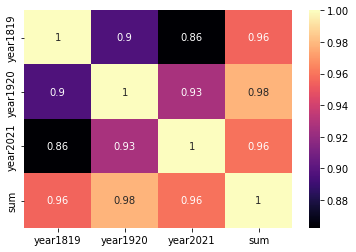

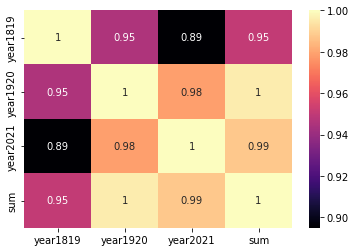

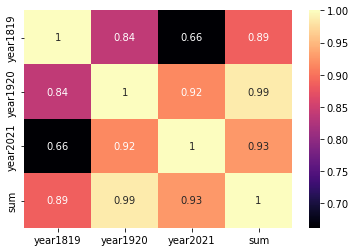

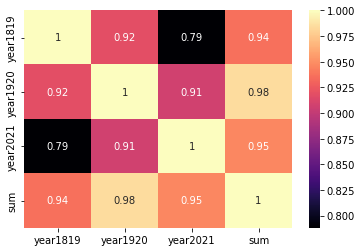

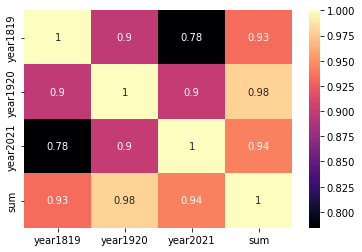

In [ ]:
plt.figure()#figsize = (10,10))
sns.heatmap(df_N[['year1819', 'year1920', 'year2021', 'sum']].corr(), annot = True, cmap = 'magma')
#sns.plt.suptitle('North')
plt.figure()#figsize = (10,10))
sns.heatmap(df_E[['year1819', 'year1920', 'year2021', 'sum']].corr(), annot = True, cmap = 'magma')
#sns.plt.suptitle('East')
plt.figure()#figsize = (10,10))
sns.heatmap(df_W[['year1819', 'year1920', 'year2021', 'sum']].corr(), annot = True, cmap = 'magma')
#sns.plt.suptitle('West')
plt.figure()#figsize = (10,10))
sns.heatmap(df_S[['year1819', 'year1920', 'year2021', 'sum']].corr(), annot = True, cmap = 'magma')
#sns.plt.suptitle('South')
plt.figure()#figsize = (10,10))
sns.heatmap(df[['year1819', 'year1920', 'year2021', 'sum']].corr(), annot = True, cmap = 'magma')
#sns.plt.suptitle('All Regions')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

48

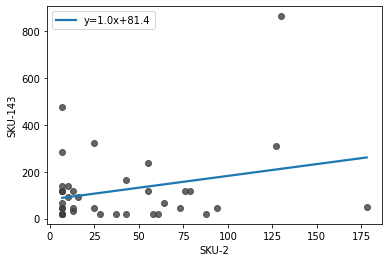

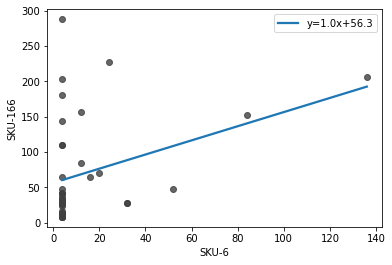

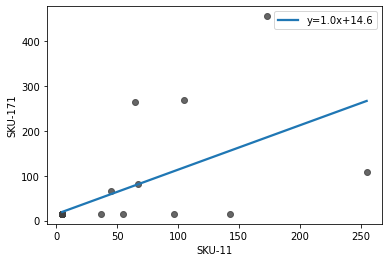

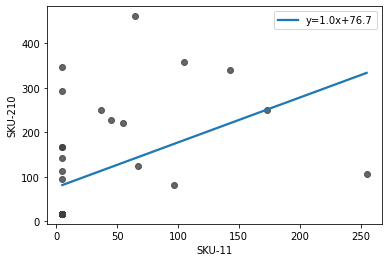

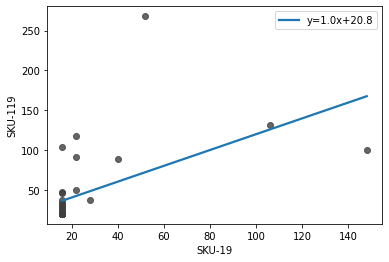

...

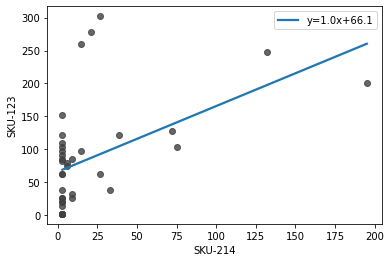

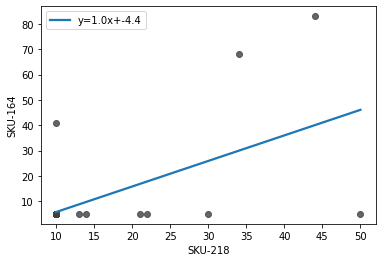

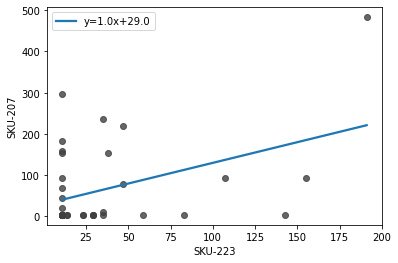

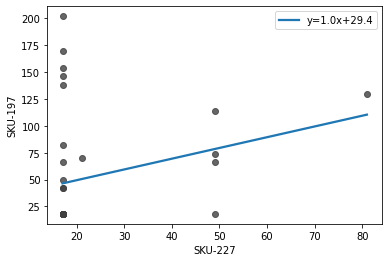

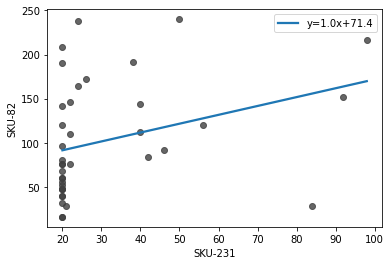

In [ ]:
from scipy import stats
count = 0

for i in df_N_T.columns:
  for j in df_N_T.columns:
    if(j!=i):
      slope, intercept, r_value, p_value, std_err = stats.linregress(df_N_T[i],df_N_T[j])
      if(slope>=0.99 and slope<=1.01 and intercept<=100):
        plt.figure()
        ax = sns.regplot(x=i, y=j, data=df_N_T, ci=None, scatter_kws=dict(color='0.25'), line_kws={'label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
        ax.legend()
        count+=1
count

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

58

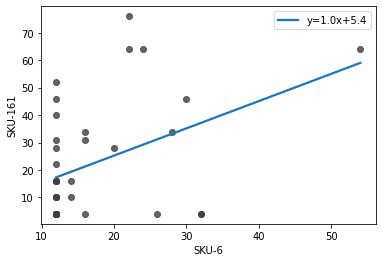

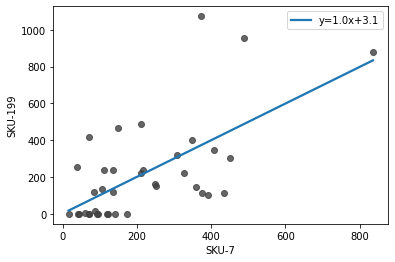

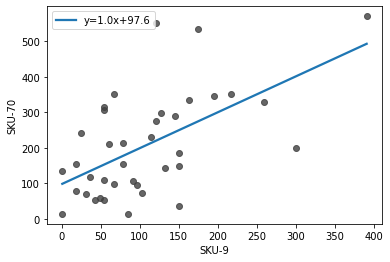

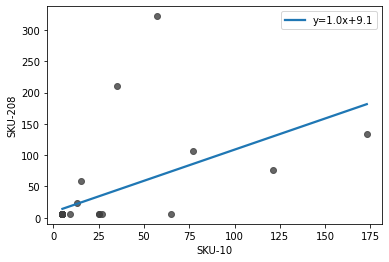

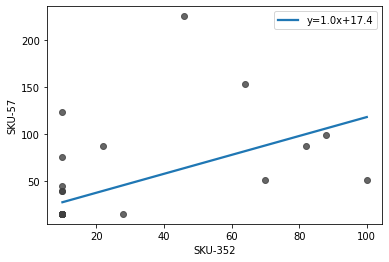

...

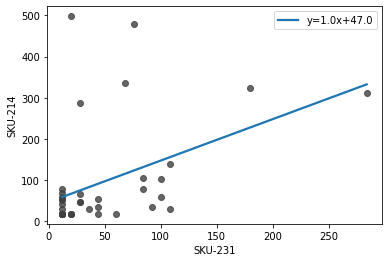

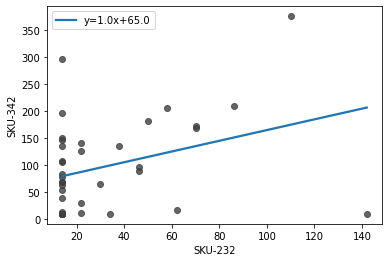

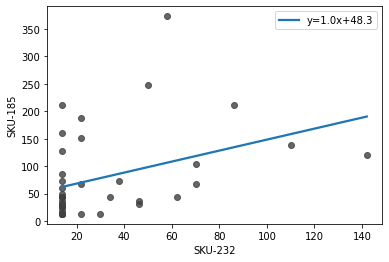

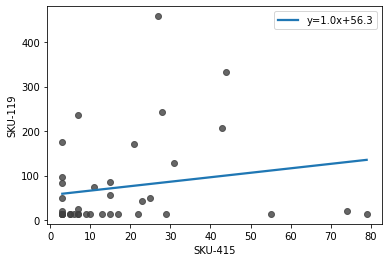

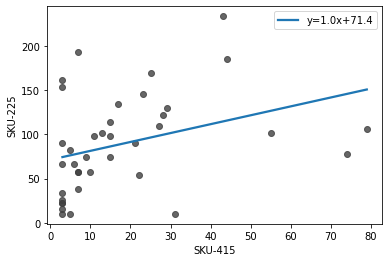

In [ ]:
from scipy import stats
count = 0

for i in df_E_T.columns:
  for j in df_E_T.columns:
    if(j!=i):
      slope, intercept, r_value, p_value, std_err = stats.linregress(df_E_T[i],df_E_T[j])
      if(slope>=0.99 and slope<=1.01 and intercept<=100):
        plt.figure()
        ax = sns.regplot(x=i, y=j, data=df_E_T, ci=None, scatter_kws=dict(color='0.25'), line_kws={'label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
        ax.legend()
        count+=1
count

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

112

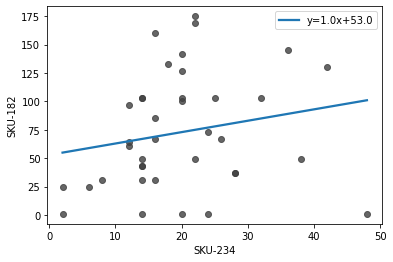

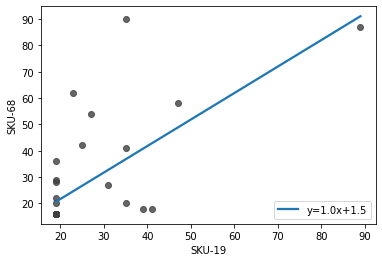

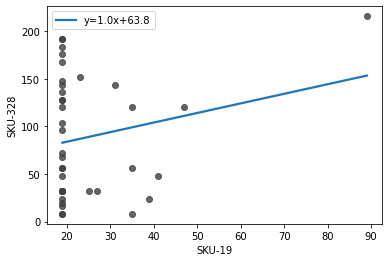

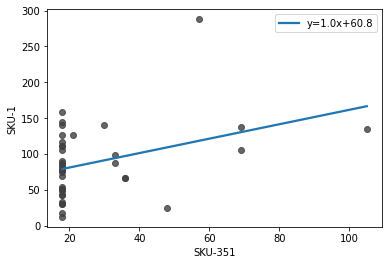

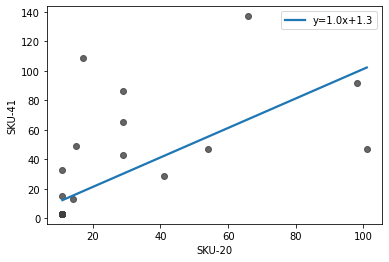

...

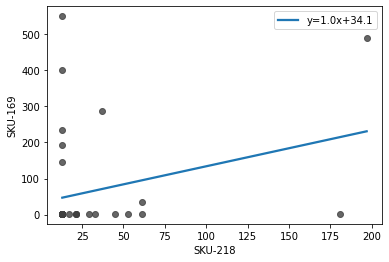

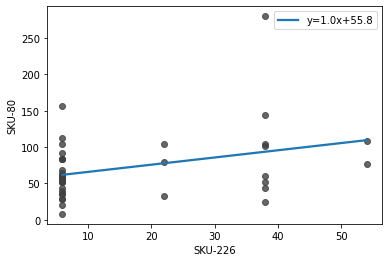

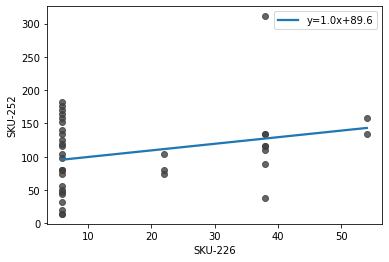

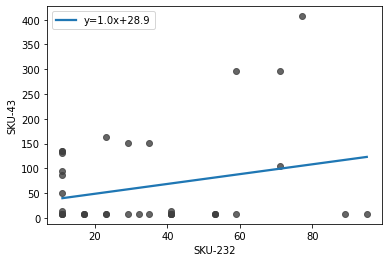

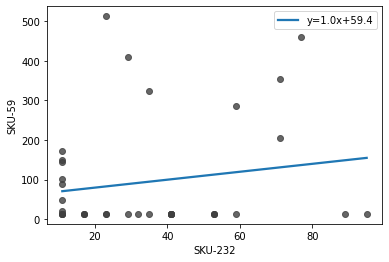

In [ ]:
from scipy import stats
count = 0

for i in df_W_T.columns:
  for j in df_W_T.columns:
    if(j!=i):
      slope, intercept, r_value, p_value, std_err = stats.linregress(df_W_T[i],df_W_T[j])
      if(slope>=0.99 and slope<=1.01 and intercept<=100):
        plt.figure()
        ax = sns.regplot(x=i, y=j, data=df_W_T, ci=None, scatter_kws=dict(color='0.25'), line_kws={'label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
        ax.legend()
        count+=1
count

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

84

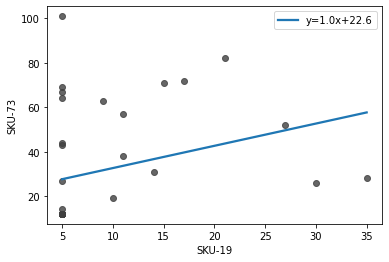

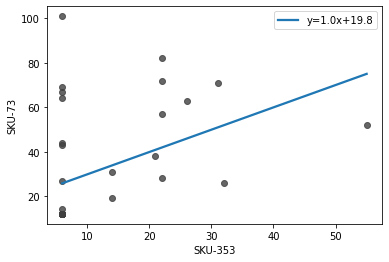

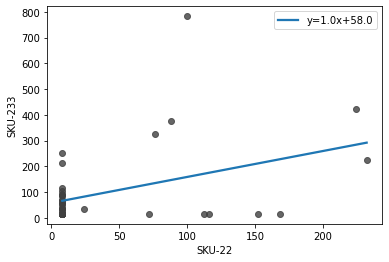

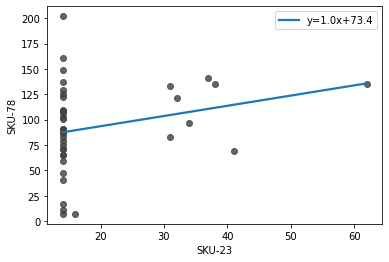

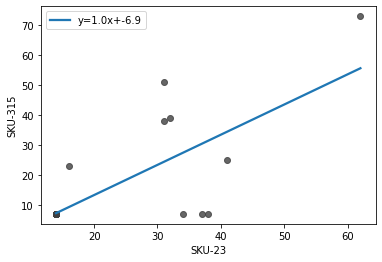

...

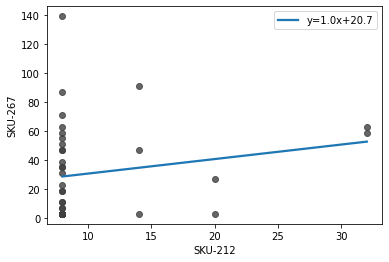

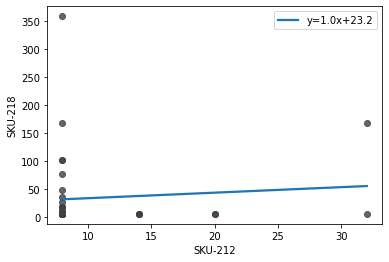

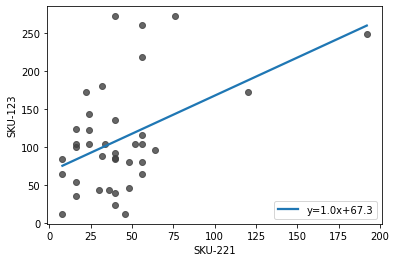

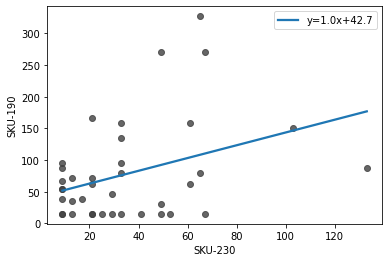

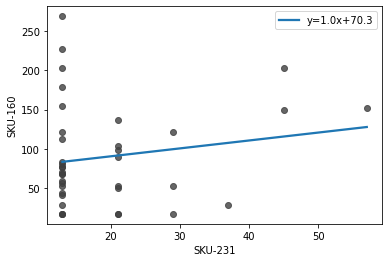

In [ ]:
from scipy import stats
count = 0

for i in df_S_T.columns:
  for j in df_S_T.columns:
    if(j!=i):
      slope, intercept, r_value, p_value, std_err = stats.linregress(df_S_T[i],df_S_T[j])
      if(slope>=0.99 and slope<=1.01 and intercept<=100):
        plt.figure()
        ax = sns.regplot(x=i, y=j, data=df_S_T, ci=None, scatter_kws=dict(color='0.25'), line_kws={'label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
        ax.legend()
        count+=1
count

---

In [ ]:
df_N.columns

Index(['Warehouse id', 'Region', 'SKU id', 'Apr-18', 'May-18', 'Jun-18',
       'Jul-18', 'Aug-18', 'Sep-18', 'Oct-18', 'Nov-18', 'Dec-18', 'Jan-19',
       'Feb-19', 'Mar-19', 'Apr-19', 'May-19', 'Jun-19', 'Jul-19', 'Aug-19',
       'Sep-19', 'Oct-19', 'Nov-19', 'Dec-19', 'Jan-20', 'Feb-20', 'Mar-20',
       'Apr-20', 'May-20', 'Jun-20', 'Jul-20', 'Aug-20', 'Sep-20', 'Oct-20',
       'Nov-20', 'Dec-20', 'Jan-21', 'Feb-21', 'Mar-21', 'Apr-21', 'May-21',
       'year1819', 'year1920', 'year2021', 'sum', 'Average', 'Popular1819',
       'Popular1920', 'Popular2021', 'Popular'],
      dtype='object')

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, accuracy_score
from sklearn.model_selection import train_test_split

X = df_N.drop(["Region", "May-21"], axis=1)
y = df_N["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
#X.head()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

X1 = X[["Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.33, random_state=42, shuffle=False)

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

y_pred = reg.predict(X_test)
#y_pred = pd.DataFrame(y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
print(reg.score(X_test, y_test))
mape

[16:22:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.4054405090647042


1.0628820328144617

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, accuracy_score
from sklearn.model_selection import train_test_split

X = df_E.drop(["Region", "May-21"], axis=1)
y = df_E["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
#X.head()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

X1 = X[["Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.33, random_state=42, shuffle=False)

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

y_pred = reg.predict(X_test)
#y_pred = pd.DataFrame(y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
print(reg.score(X_test, y_test))
mape

[16:22:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.5096396874154113


1.4741803278976697

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, accuracy_score
from sklearn.model_selection import train_test_split

X = df_W.drop(["Region", "May-21"], axis=1)
y = df_W["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
#X.head()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

X1 = X[["Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.33, random_state=42, shuffle=False)

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

y_pred = reg.predict(X_test)
#y_pred = pd.DataFrame(y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
print(reg.score(X_test, y_test))
mape

[16:22:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.8329212527353176


3.1985850844609605

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, accuracy_score
from sklearn.model_selection import train_test_split

X = df_S.drop(["Region", "May-21"], axis=1)
y = df_S["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
#X.head()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

X1 = X[["Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.33, random_state=42, shuffle=False)

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

y_pred = reg.predict(X_test)
#y_pred = pd.DataFrame(y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
print(reg.score(X_test, y_test))
mape

[16:22:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.679791716029863


1.5115086853028588

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, accuracy_score
from sklearn.model_selection import train_test_split

X = df.drop(["Warehouse id", "SKU id", "May-21"], axis=1)
y = df["May-21"]

#X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
#X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
X['Region'] = X['Region'].replace({'NORTH': 1}, regex=True)
X['Region'] = X['Region'].replace({'WEST': 2}, regex=True)
X['Region'] = X['Region'].replace({'EAST': 3}, regex=True)
X['Region'] = X['Region'].replace({'SOUTH': 4}, regex=True)
#X.head()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

#X1 = X[["Region", "Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, shuffle=False)

reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

y_pred = reg.predict(X_test)
#y_pred = pd.DataFrame(y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
print(reg.score(X_test, y_test))
mape

[16:24:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.440287834753035


1.4846480670887523

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor

X = df.drop(["May-21"], axis=1)
y = df["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
X['Region'] = X['Region'].replace({'NORTH': 1}, regex=True)
X['Region'] = X['Region'].replace({'WEST': 2}, regex=True)
X['Region'] = X['Region'].replace({'EAST': 3}, regex=True)
X['Region'] = X['Region'].replace({'SOUTH': 4}, regex=True)

X1 = X[["Region", "Apr-21", "Sep-20", "Oct-20", "Oct-19"]]
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.33, random_state=42, shuffle=False)
reg = ExtraTreesRegressor(n_estimators=100, random_state=0).fit(X_train, y_train)
print(reg.score(X_test, y_test))
mape = mean_absolute_percentage_error(y_test, y_pred)
mape

-1.665685572059831


2.019541652011362

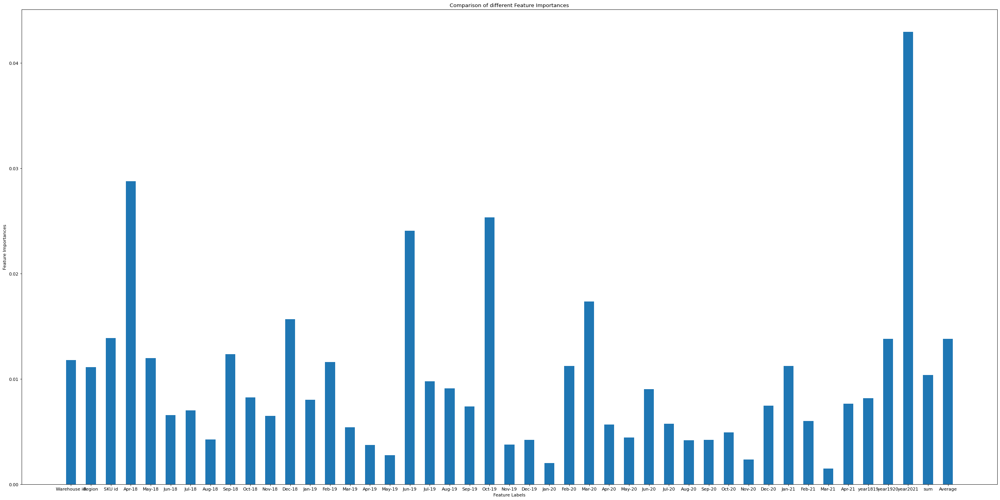

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
# Building the model
extra_tree_forest = ExtraTreesClassifier(n_estimators = 5,
                                        criterion ='entropy', max_features = 2)

X = df.drop(["May-21"], axis=1) 
y = df["May-21"]

X['SKU id'] = X['SKU id'].replace({'SKU-': ''}, regex=True)
X['Warehouse id'] = X['Warehouse id'].replace({'Wh-': ''}, regex=True)
X['Region'] = X['Region'].replace({'NORTH': 1}, regex=True)
X['Region'] = X['Region'].replace({'WEST': 2}, regex=True)
X['Region'] = X['Region'].replace({'EAST': 3}, regex=True)
X['Region'] = X['Region'].replace({'SOUTH': 4}, regex=True)

# Training the model
extra_tree_forest.fit(X, y)
  
# Computing the importance of each feature
feature_importance = extra_tree_forest.feature_importances_
  
# Normalizing the individual importances
feature_importance_normalized = np.std([tree.feature_importances_ for tree in 
                                        extra_tree_forest.estimators_],
                                        axis = 0)

from matplotlib.pyplot import figure

figure(figsize=(40, 20), dpi=80)
# Plotting a Bar Graph to compare the models
plt.bar(X.columns, feature_importance_normalized, width=0.5)
plt.xlabel('Feature Labels')
plt.ylabel('Feature Importances')
plt.title('Comparison of different Feature Importances')
plt.show()

In [ ]:
print(len(df_N))
print(len(df_E))
print(len(df_W))
print(len(df_S))

233
212
308
286
